In [1]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import IPython.display as ipd
import os
import glob
import soundfile as sf
from scipy import signal
import shutil
import re



# Data Preprocessing

In [2]:
def extract_and_highlight_hammer_sounds(
                                        file_path, 
                                        name,
                                        stem,
                                        output_dir,
                                        threshold=0.1,
                                        start_time=49,
                                        end_time=52,
                                        min_interval=0.1, 
                                        post_duration=0.15):
    # Load the audio file
    audio, sr = librosa.load(file_path, sr=None)

    # Extract the desired segment of the audio file
    start_sample = librosa.time_to_samples(start_time, sr=sr)
    end_sample = librosa.time_to_samples(end_time, sr=sr)
    audio_segment = audio[start_sample:end_sample]
    
    # Calculate the absolute value of the audio segment (amplitude envelope)
    amplitude_envelope = np.abs(audio_segment)
    
    # Find points where the amplitude envelope exceeds the threshold
    hammering_points = np.where(amplitude_envelope > threshold)[0]
    
    # Convert sample points to time, adjusted for the segment start time
    hammering_times = librosa.samples_to_time(hammering_points, sr=sr) + start_time
    
    # Filter out hammering times that are too close to each other
    filtered_hammering_times = []
    for time in hammering_times:
        if not filtered_hammering_times or (time - filtered_hammering_times[-1] >= min_interval):
            filtered_hammering_times.append(time)
    
    # Plot the entire segment with hammer sounds highlighted
    plt.figure(figsize=(15, 4))
    times = np.arange(start_sample, end_sample) / sr
    plt.plot(times, audio_segment, label='Audio Waveform')
    
    # Extract, save, and highlight each hammer sound segment
    for i, time in enumerate(filtered_hammering_times):
        start_sample_highlight = librosa.time_to_samples(time, sr=sr)
        end_sample_highlight = librosa.time_to_samples(time + post_duration, sr=sr)
        
        # Ensure we don't go past the end of the audio
        end_sample_highlight = min(end_sample_highlight, len(audio))
        
        # Extract the segment
        hammer_sound = audio[start_sample_highlight:end_sample_highlight]
        
        # Save the segment to a file
        output_file_name = os.path.join(output_dir, f"{name}_hammer_sound_{i+1}_S{stem}.wav")
        sf.write(output_file_name, hammer_sound, sr)
        
        # Highlight the hammer sound on the plot
        plt.axvspan(time, time + post_duration, color='red', alpha=0.5)
    
    plt.title('Audio Segment with Hammer Sounds Highlighted')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join('./fig/', f"highlighted_hammer_sounds_{name}_{start_time}-{end_time}.png"))
    plt.show()
    print(f"Extracted and highlighted {len(filtered_hammering_times)} hammer sounds.")


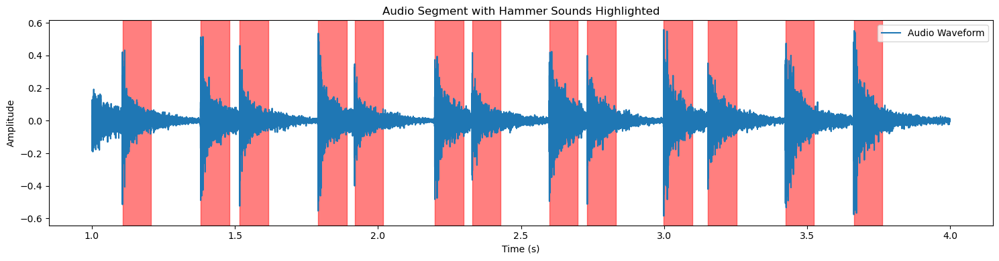

Extracted and highlighted 13 hammer sounds.


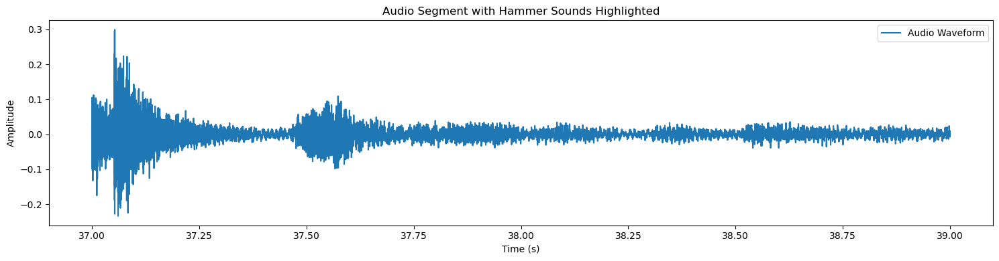

Extracted and highlighted 0 hammer sounds.


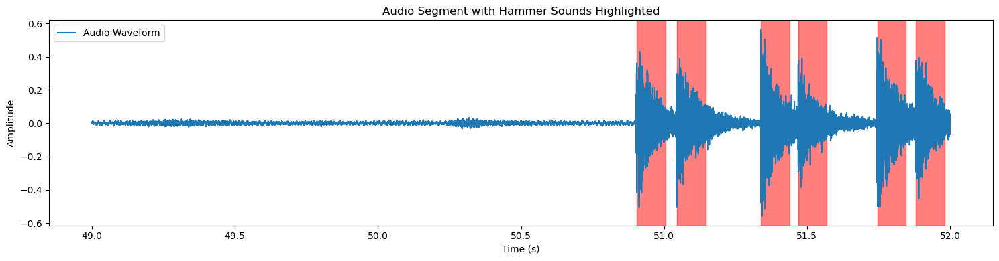

Extracted and highlighted 6 hammer sounds.


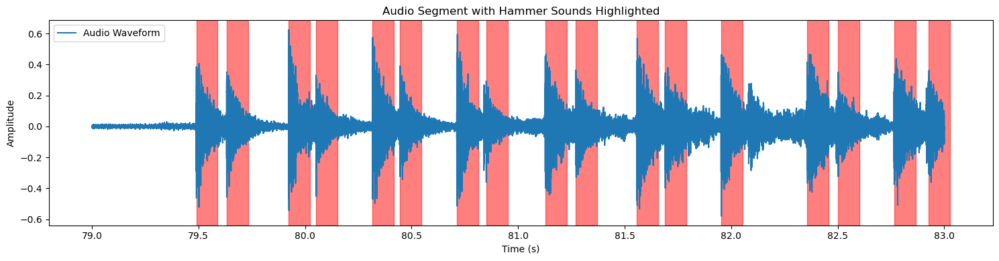

Extracted and highlighted 17 hammer sounds.


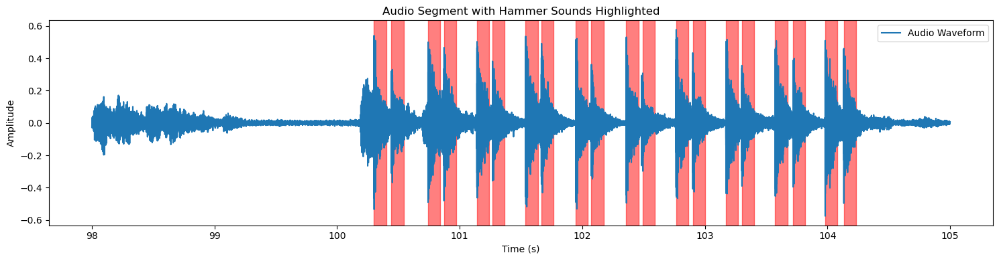

Extracted and highlighted 20 hammer sounds.


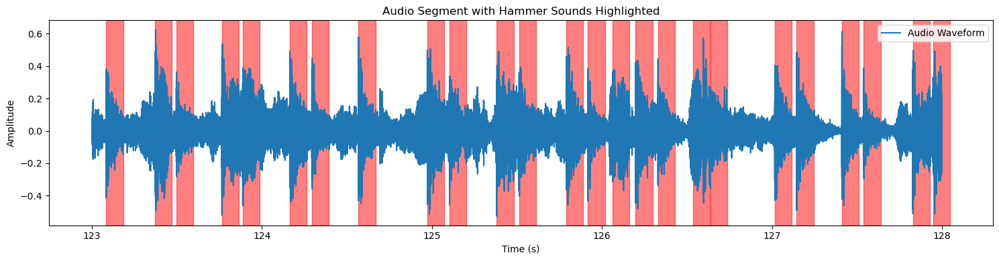

Extracted and highlighted 25 hammer sounds.


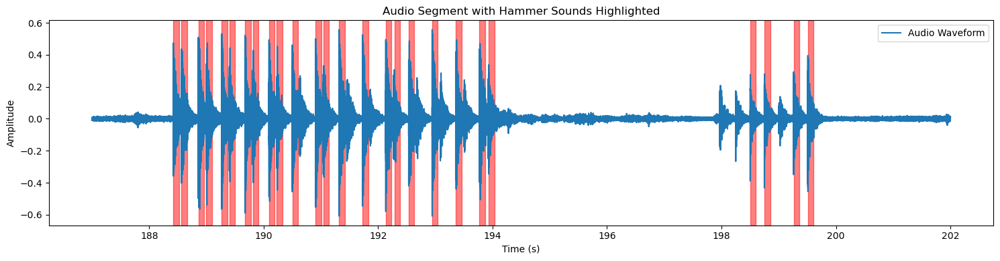

Extracted and highlighted 26 hammer sounds.


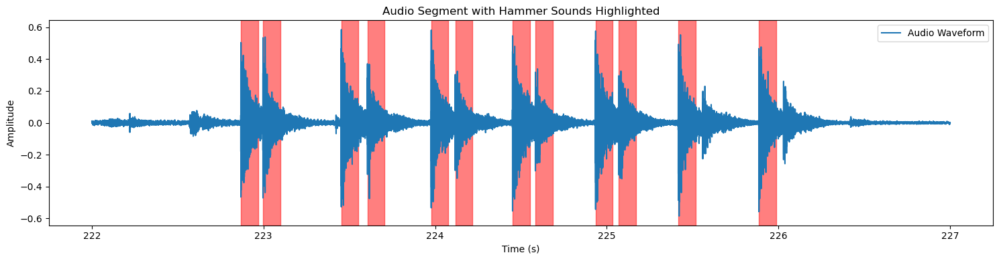

Extracted and highlighted 12 hammer sounds.


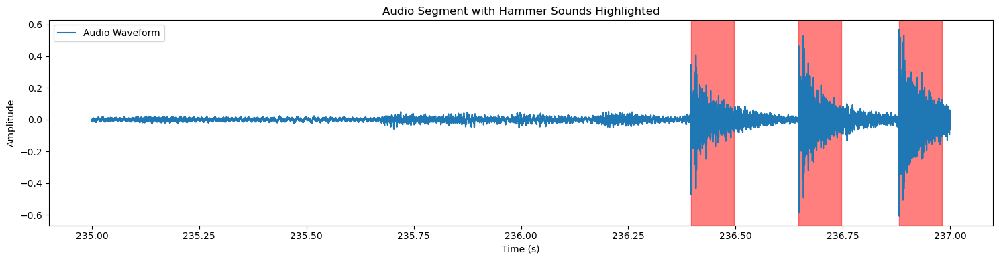

Extracted and highlighted 3 hammer sounds.


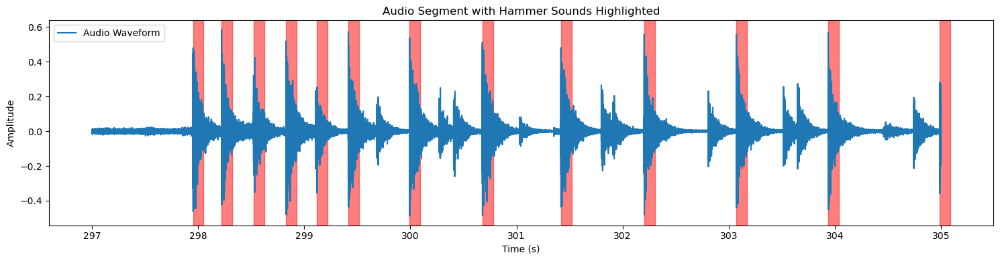

Extracted and highlighted 13 hammer sounds.


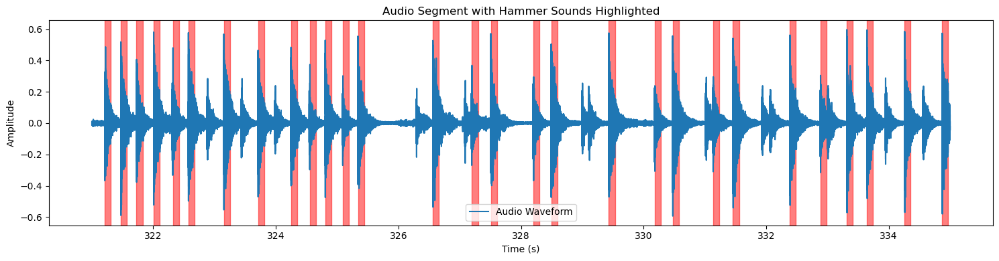

Extracted and highlighted 29 hammer sounds.


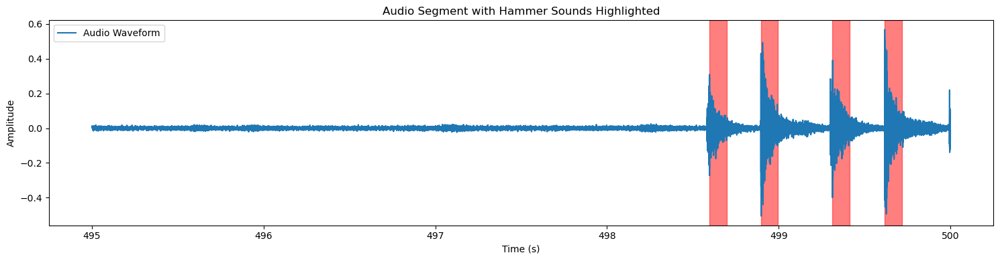

Extracted and highlighted 4 hammer sounds.


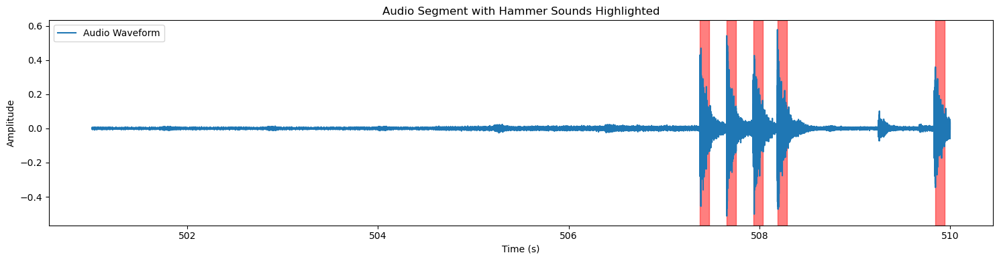

Extracted and highlighted 5 hammer sounds.


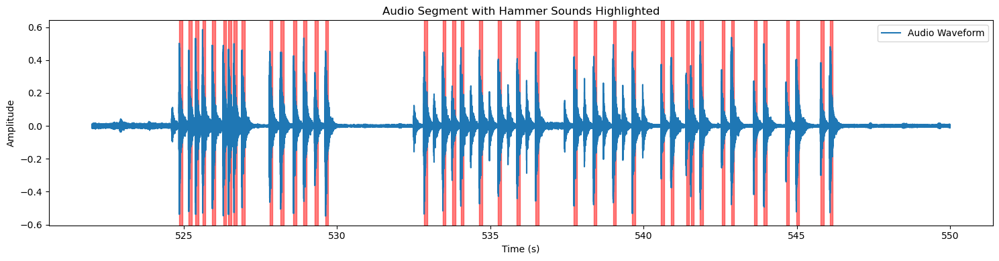

Extracted and highlighted 40 hammer sounds.


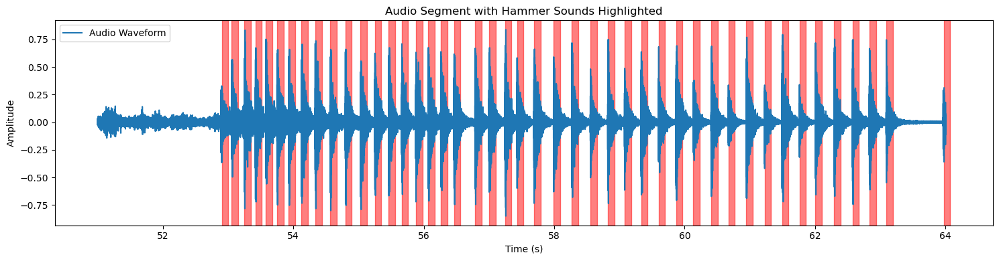

Extracted and highlighted 45 hammer sounds.


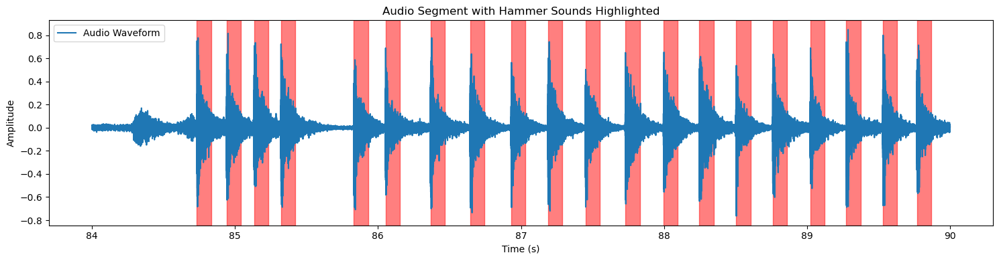

Extracted and highlighted 20 hammer sounds.


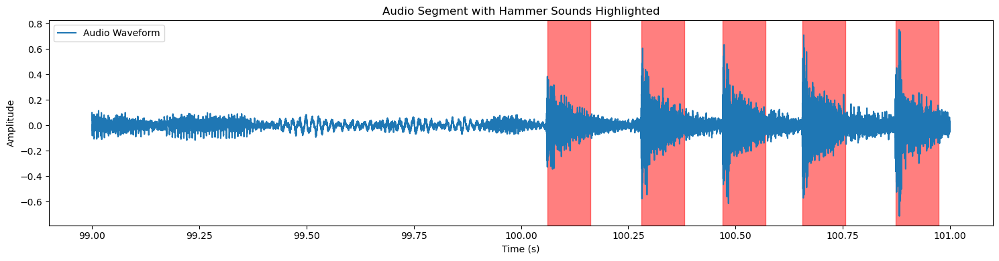

Extracted and highlighted 5 hammer sounds.


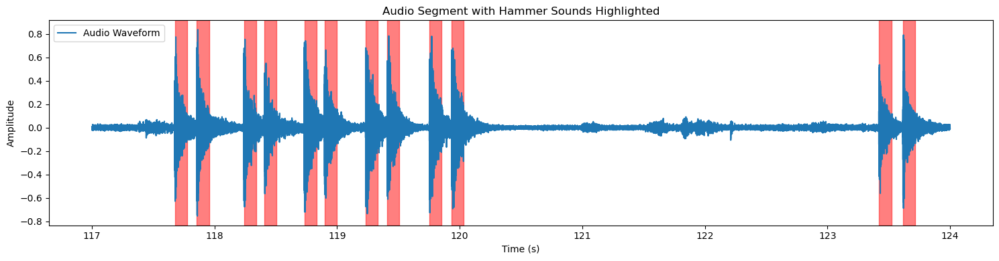

Extracted and highlighted 12 hammer sounds.


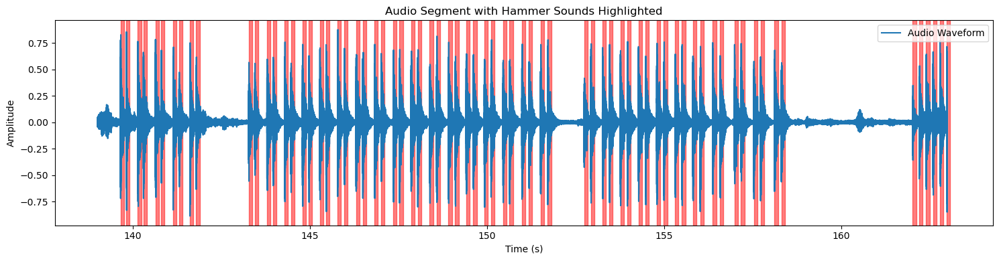

Extracted and highlighted 72 hammer sounds.


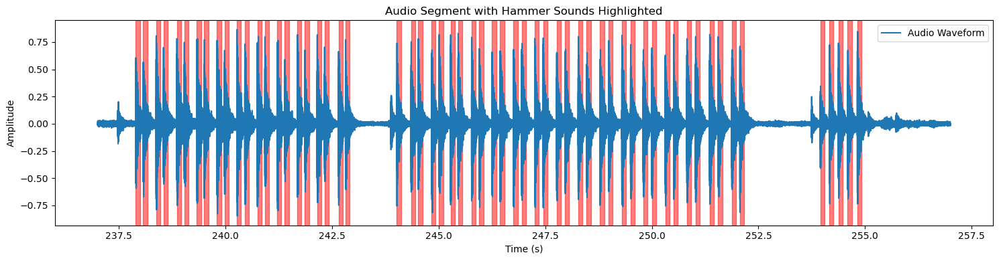

Extracted and highlighted 60 hammer sounds.


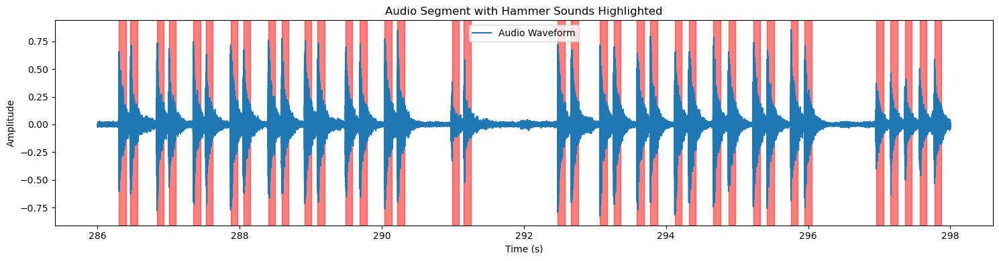

Extracted and highlighted 37 hammer sounds.


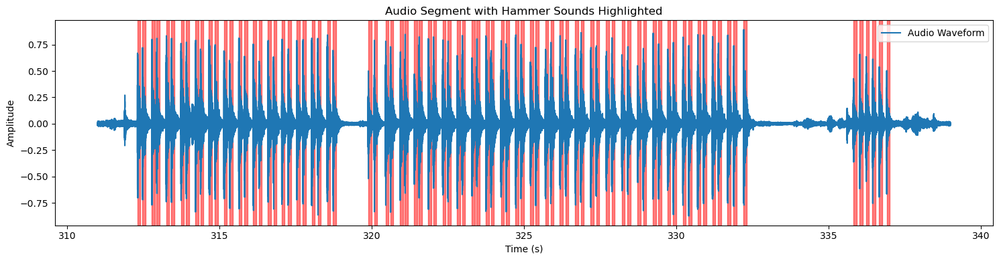

Extracted and highlighted 85 hammer sounds.


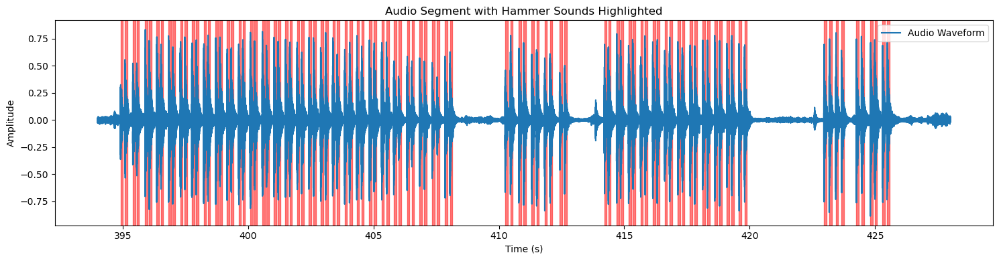

Extracted and highlighted 100 hammer sounds.


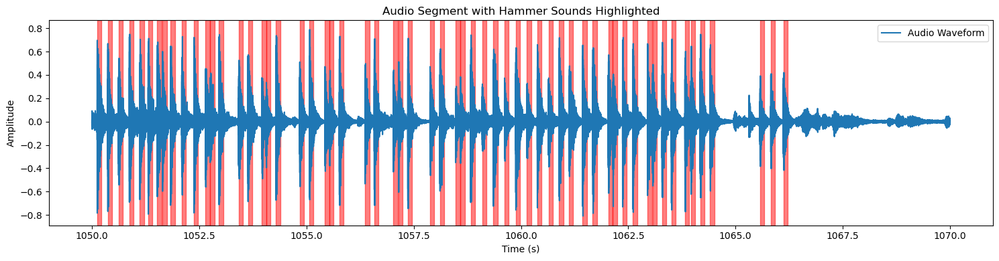

Extracted and highlighted 60 hammer sounds.


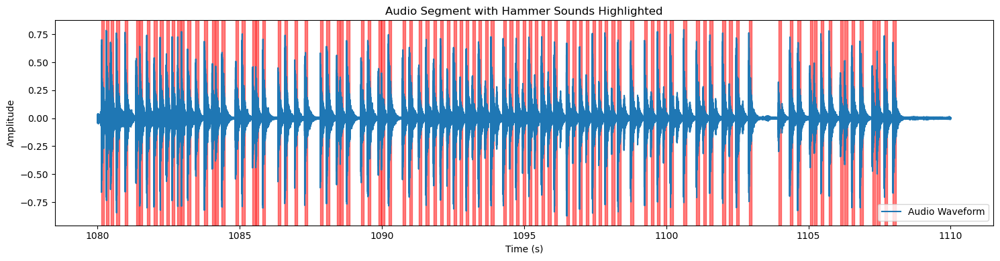

Extracted and highlighted 100 hammer sounds.


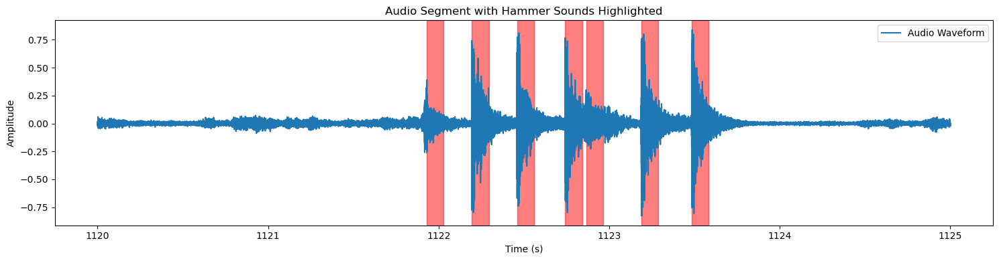

Extracted and highlighted 7 hammer sounds.


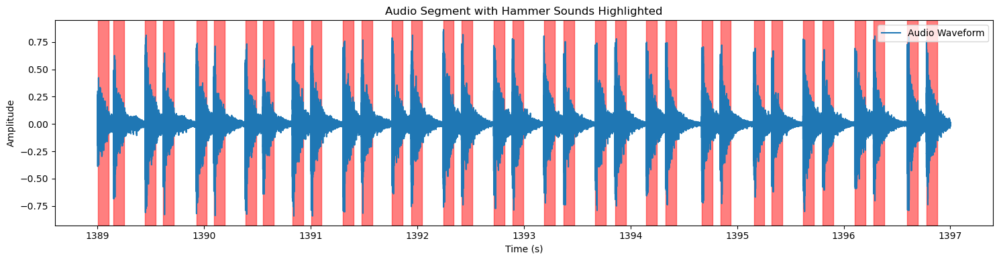

Extracted and highlighted 34 hammer sounds.


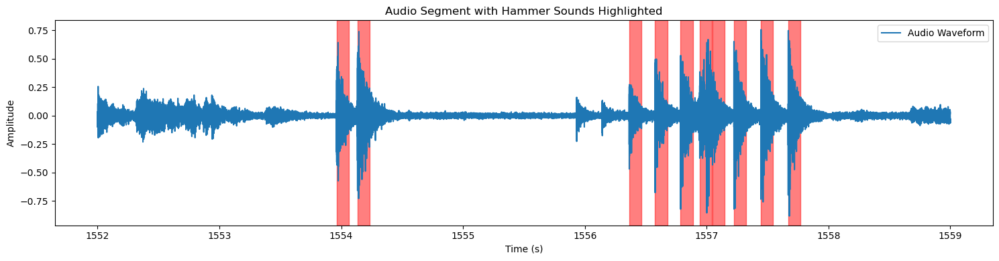

Extracted and highlighted 10 hammer sounds.


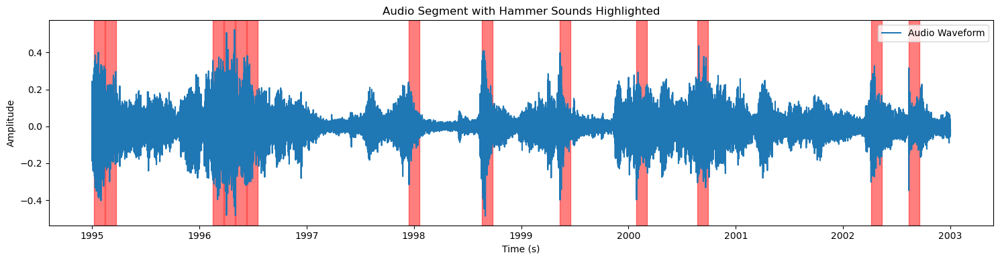

Extracted and highlighted 13 hammer sounds.


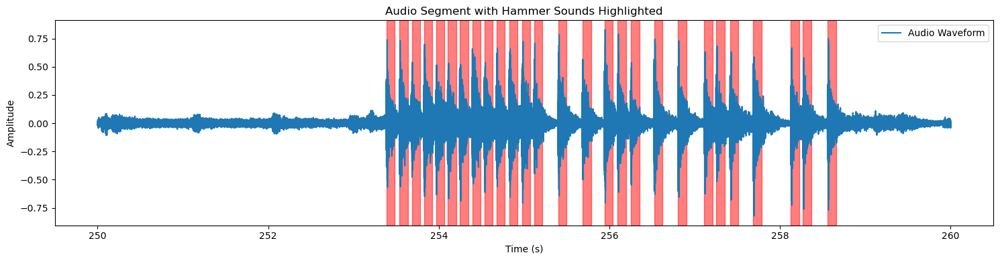

Extracted and highlighted 27 hammer sounds.


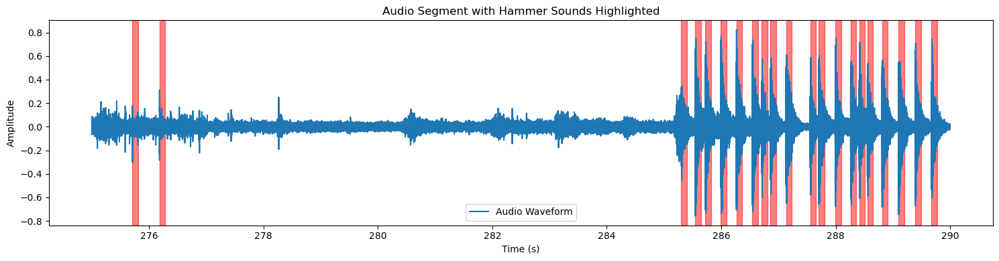

Extracted and highlighted 21 hammer sounds.


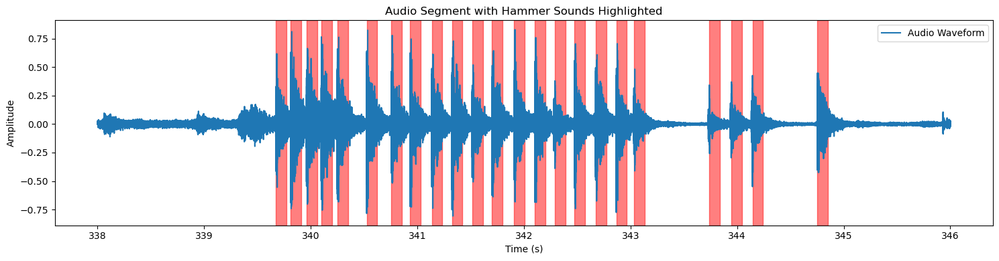

Extracted and highlighted 23 hammer sounds.


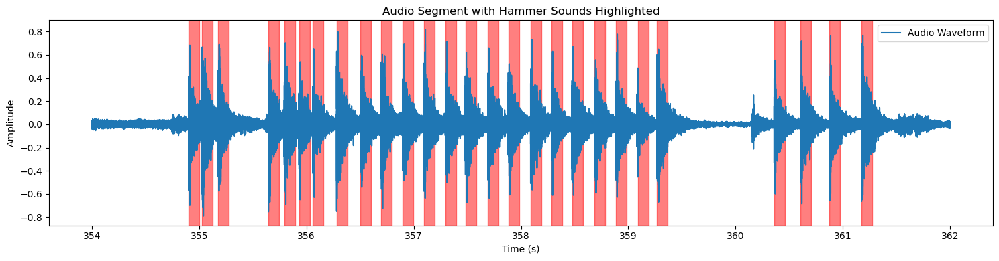

Extracted and highlighted 27 hammer sounds.


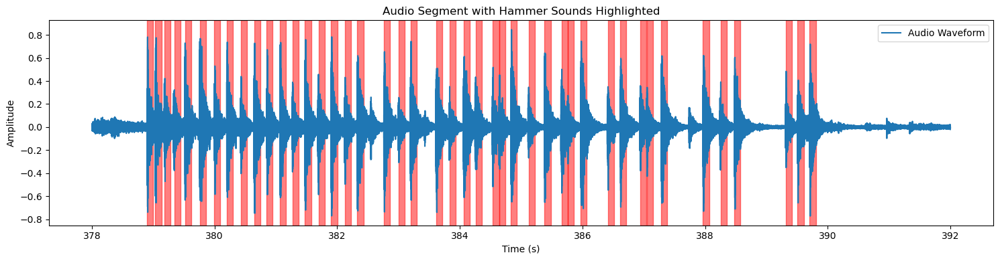

Extracted and highlighted 44 hammer sounds.


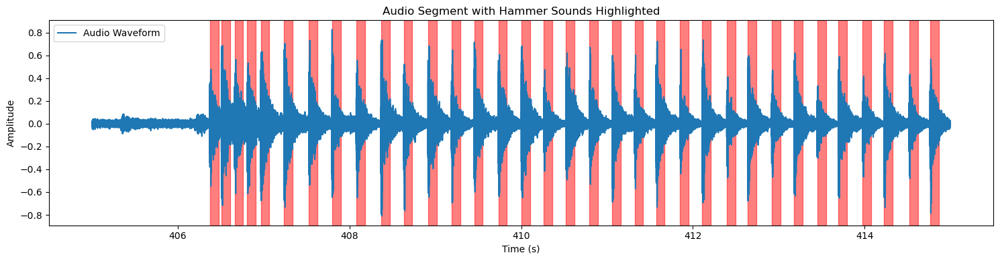

Extracted and highlighted 34 hammer sounds.


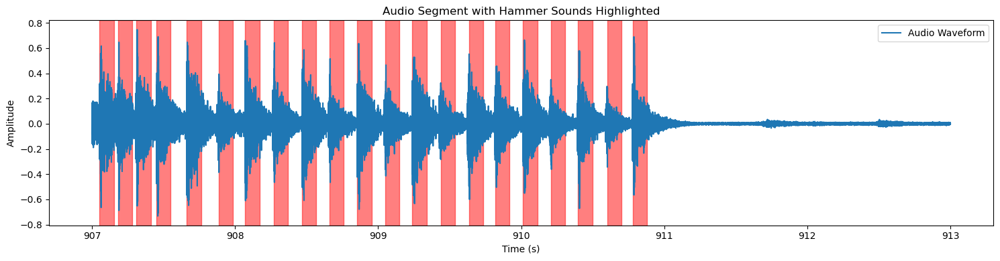

Extracted and highlighted 21 hammer sounds.


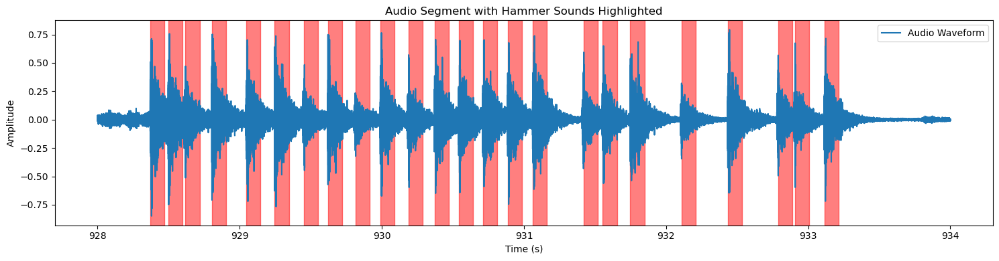

Extracted and highlighted 24 hammer sounds.


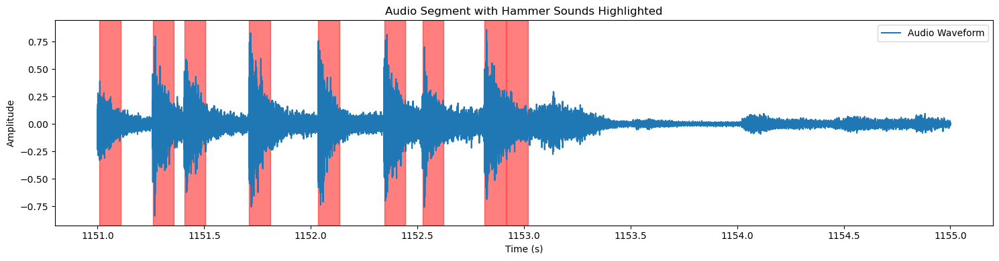

Extracted and highlighted 9 hammer sounds.


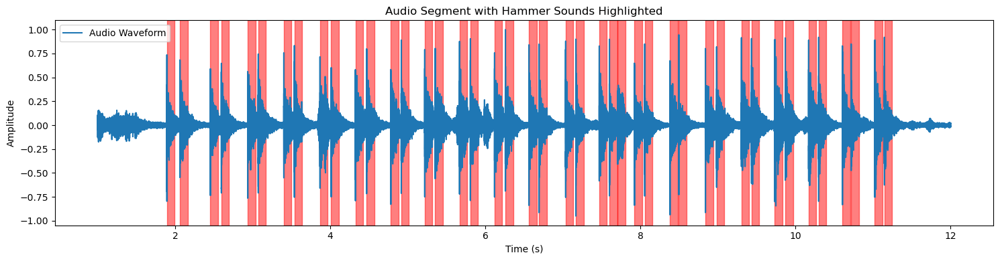

Extracted and highlighted 43 hammer sounds.


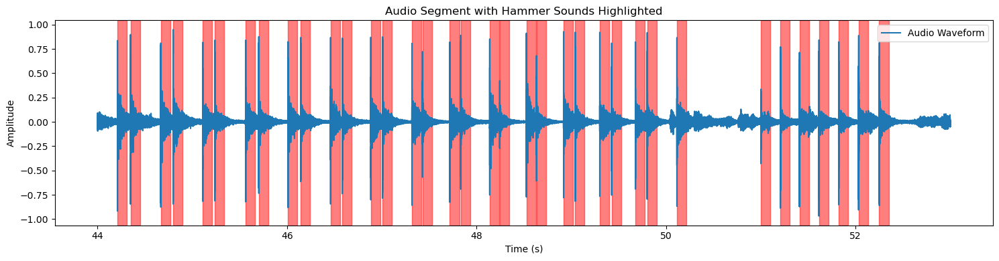

Extracted and highlighted 36 hammer sounds.


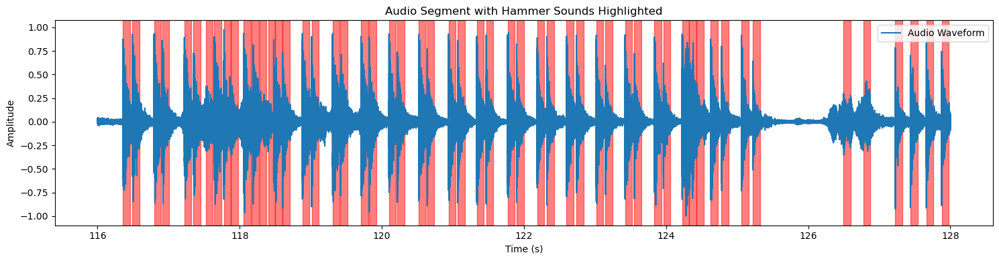

Extracted and highlighted 55 hammer sounds.


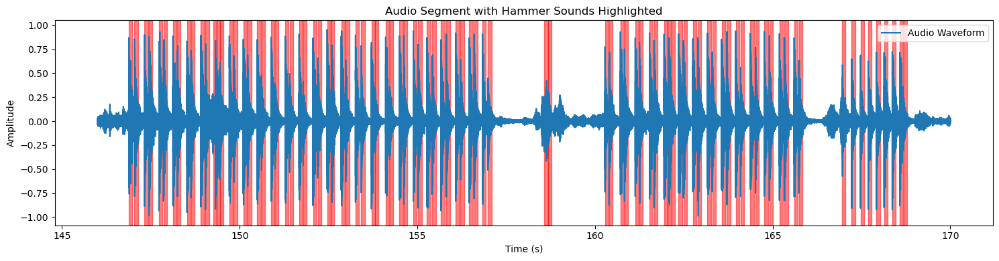

Extracted and highlighted 93 hammer sounds.


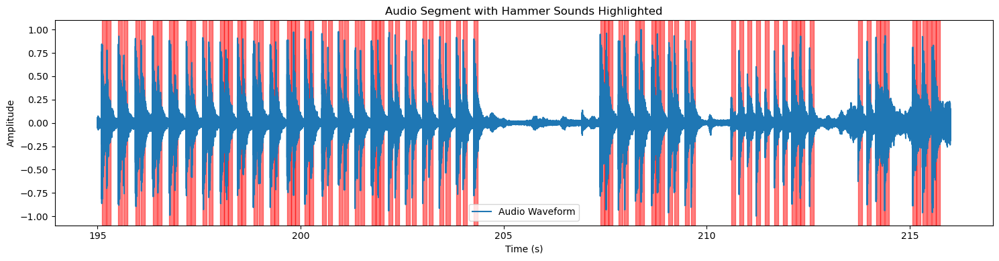

Extracted and highlighted 84 hammer sounds.


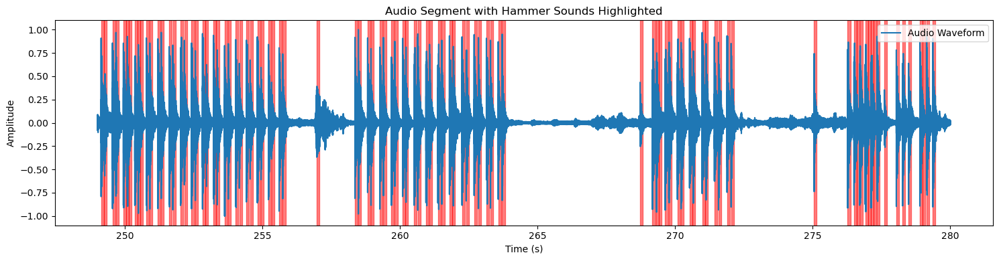

Extracted and highlighted 97 hammer sounds.


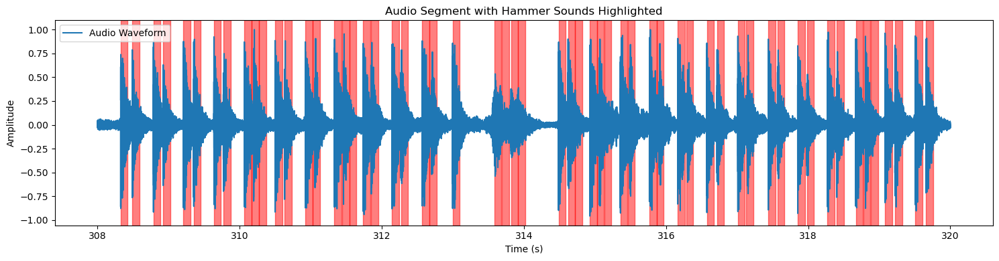

Extracted and highlighted 58 hammer sounds.


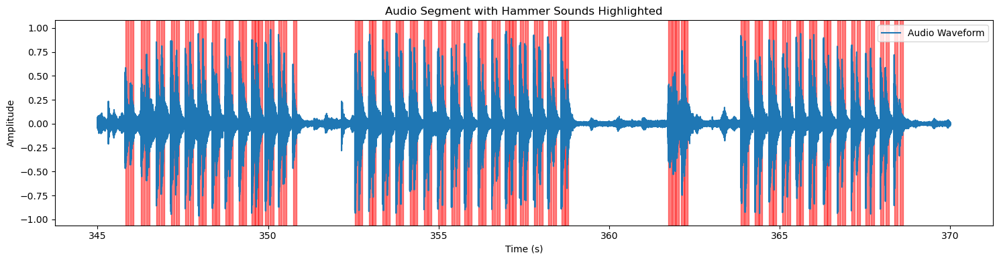

Extracted and highlighted 88 hammer sounds.


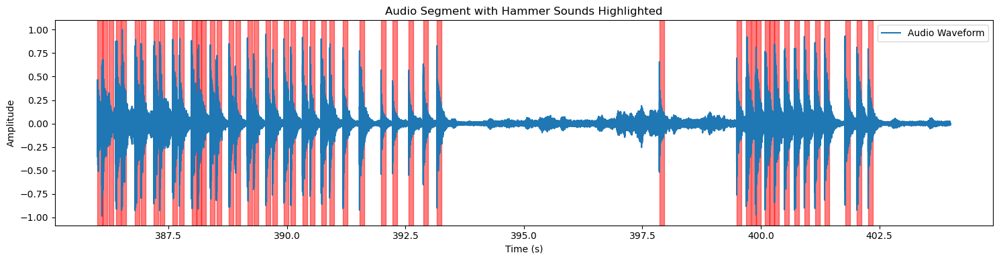

Extracted and highlighted 51 hammer sounds.


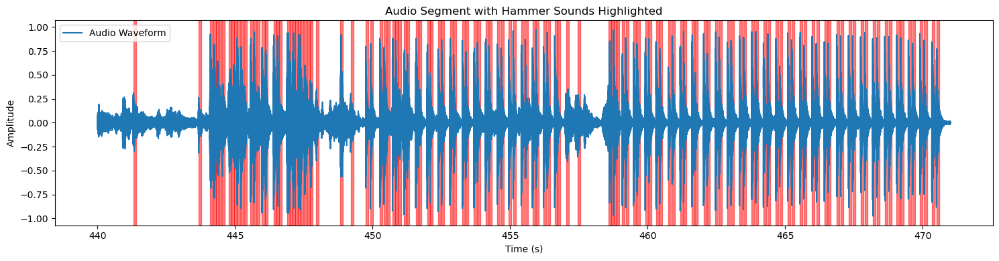

Extracted and highlighted 129 hammer sounds.


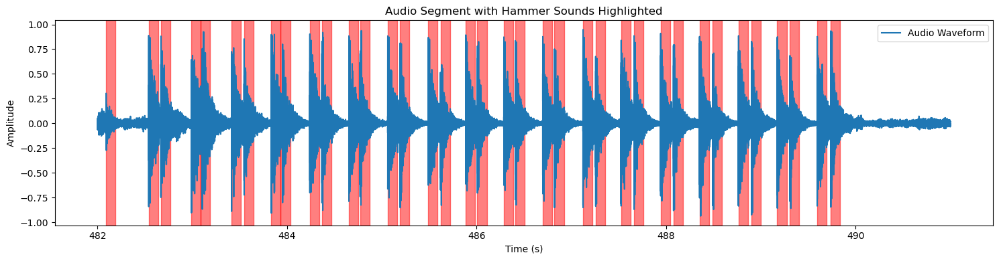

Extracted and highlighted 37 hammer sounds.


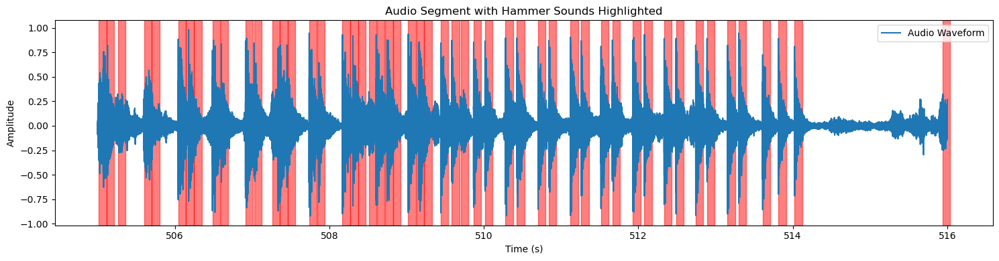

Extracted and highlighted 52 hammer sounds.


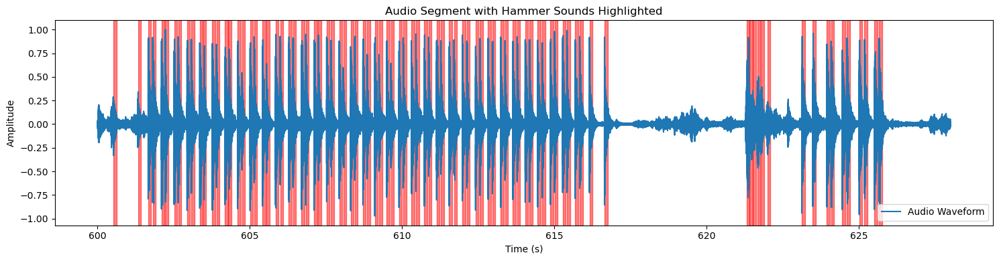

Extracted and highlighted 90 hammer sounds.


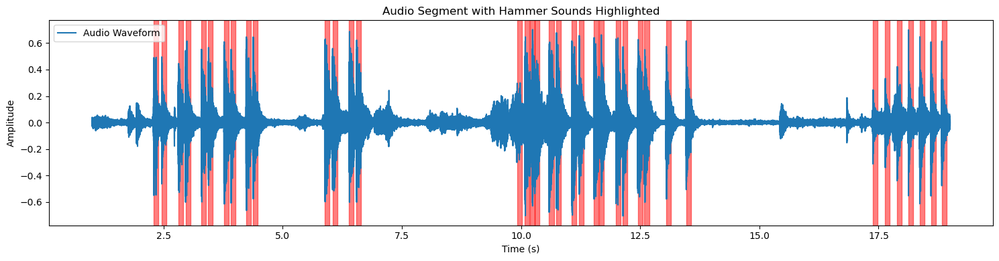

Extracted and highlighted 37 hammer sounds.


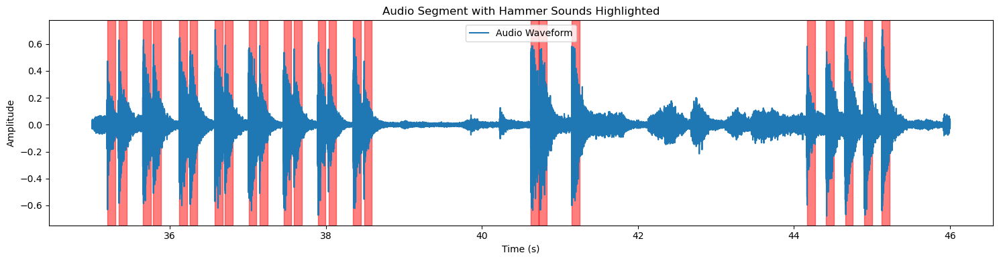

Extracted and highlighted 24 hammer sounds.


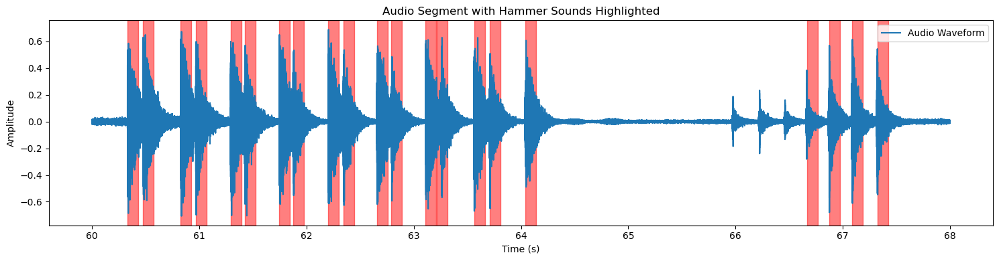

Extracted and highlighted 21 hammer sounds.


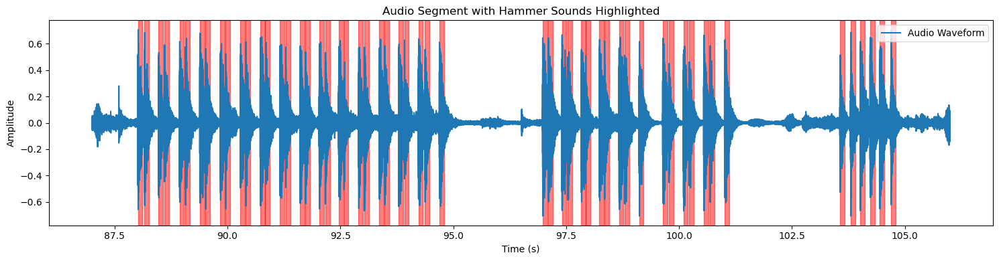

Extracted and highlighted 55 hammer sounds.


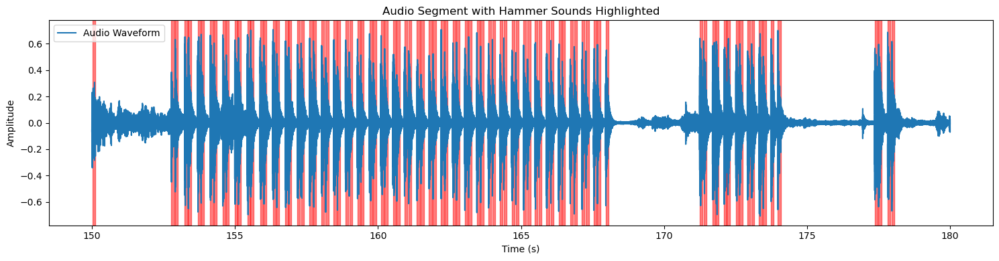

Extracted and highlighted 92 hammer sounds.


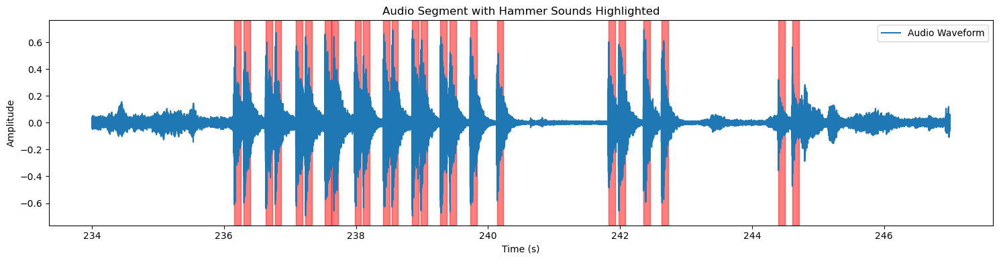

Extracted and highlighted 24 hammer sounds.


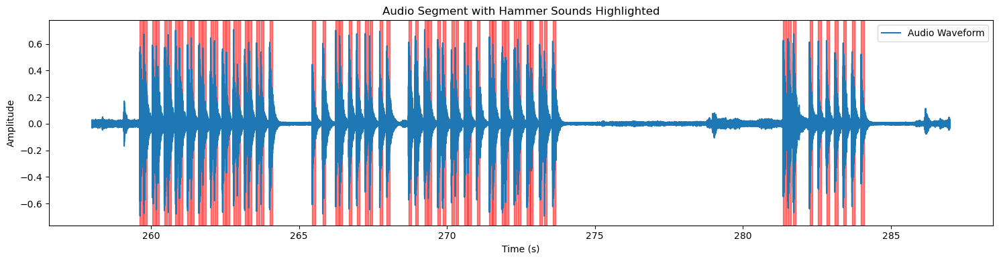

Extracted and highlighted 65 hammer sounds.


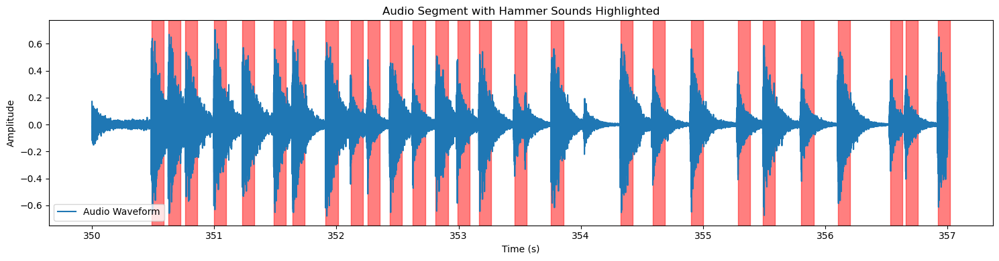

Extracted and highlighted 27 hammer sounds.


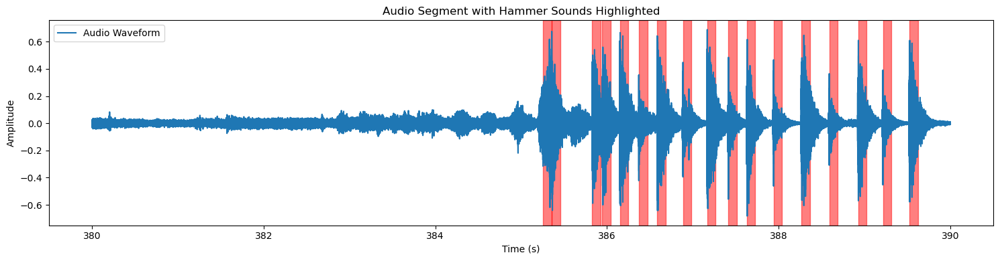

Extracted and highlighted 17 hammer sounds.


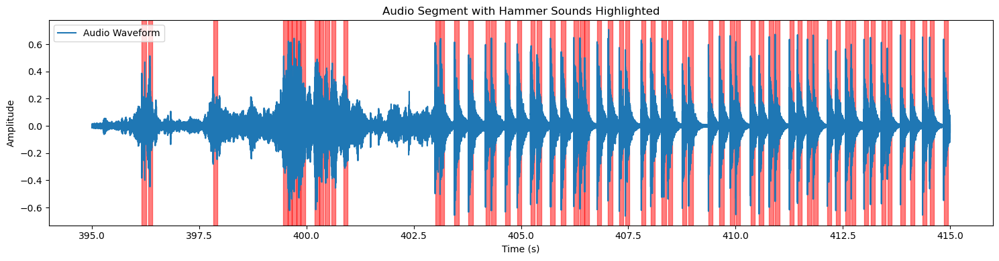

Extracted and highlighted 63 hammer sounds.


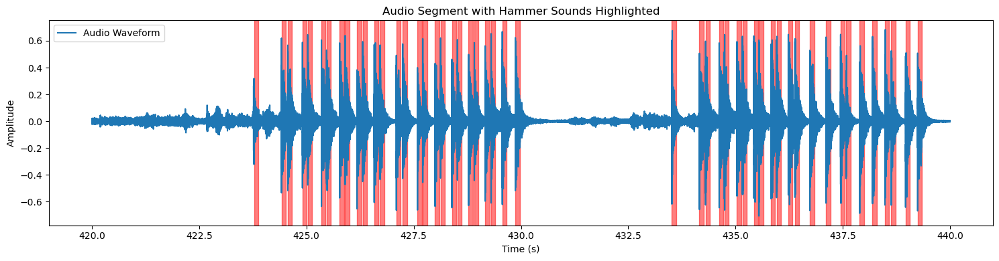

Extracted and highlighted 50 hammer sounds.


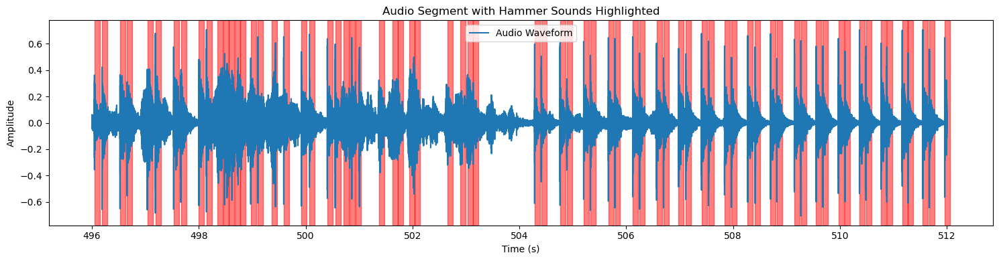

Extracted and highlighted 72 hammer sounds.


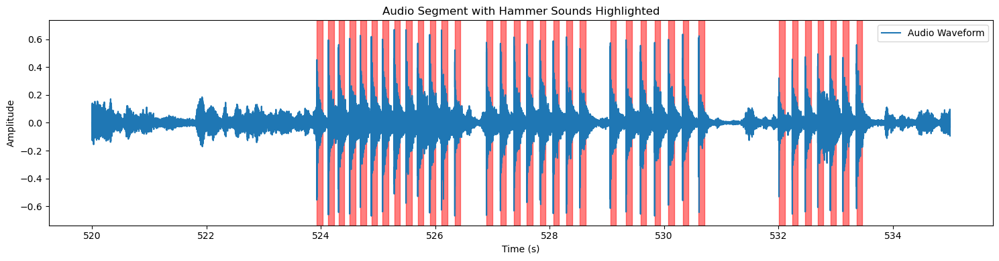

Extracted and highlighted 35 hammer sounds.


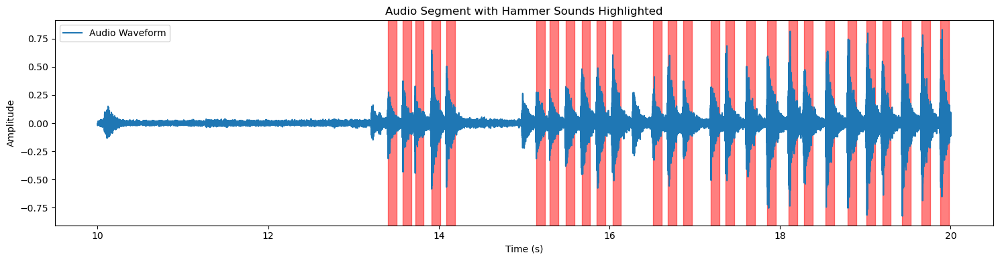

Extracted and highlighted 27 hammer sounds.


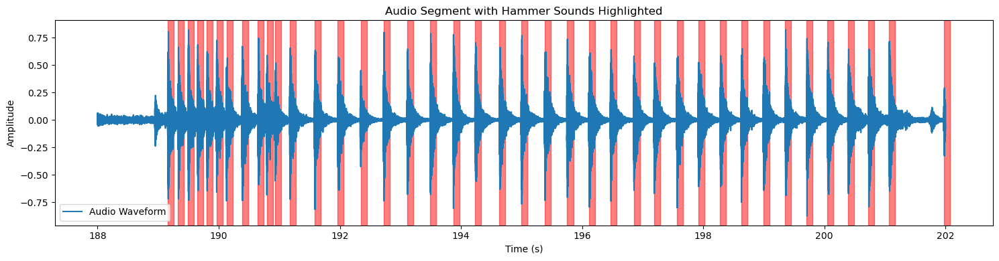

Extracted and highlighted 40 hammer sounds.


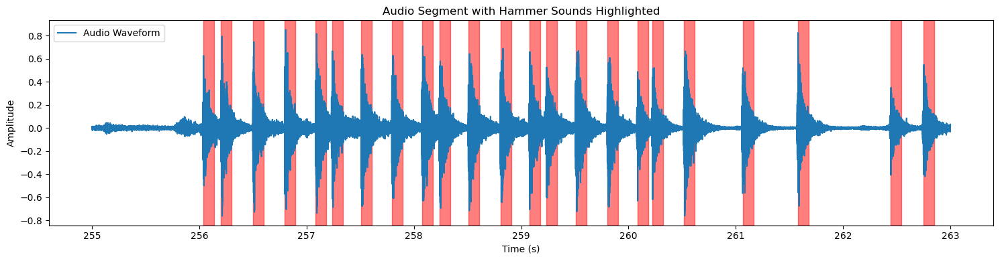

Extracted and highlighted 23 hammer sounds.


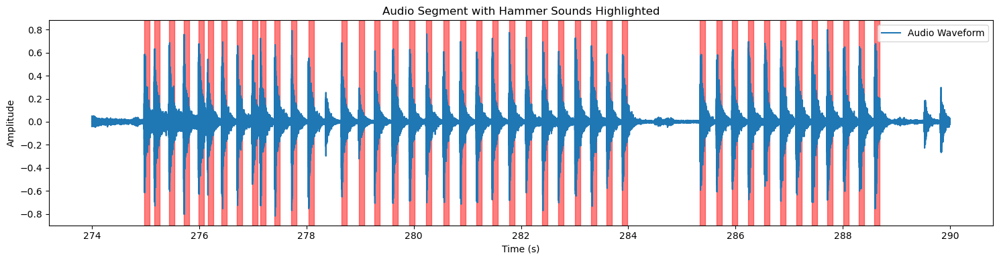

Extracted and highlighted 43 hammer sounds.


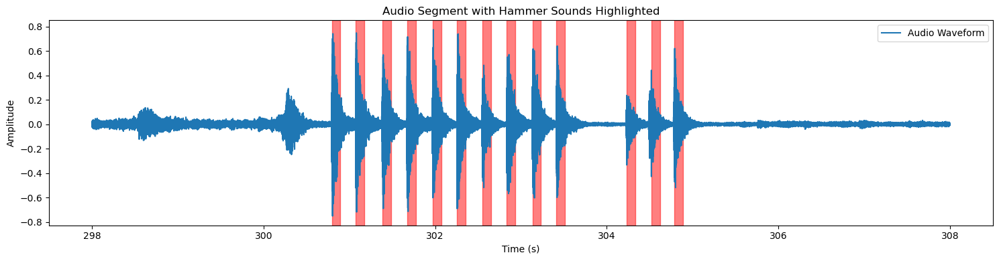

Extracted and highlighted 13 hammer sounds.


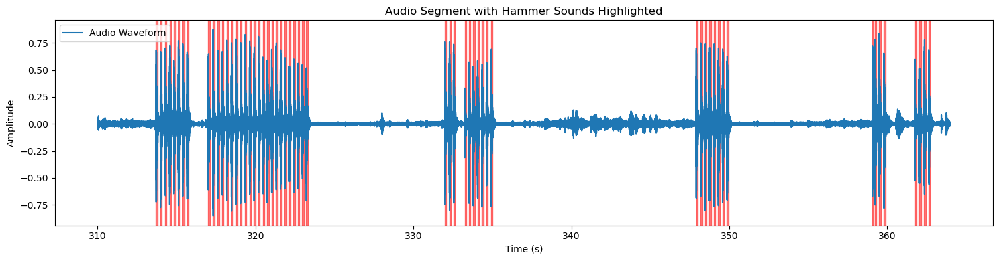

Extracted and highlighted 57 hammer sounds.


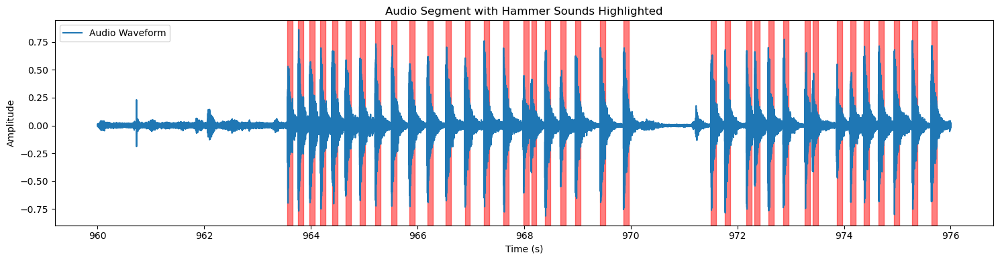

Extracted and highlighted 37 hammer sounds.


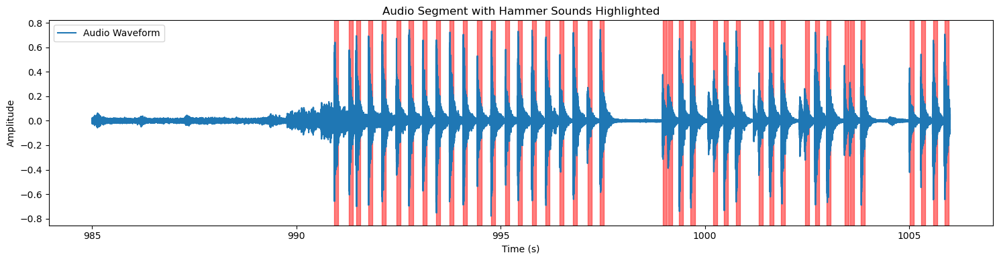

Extracted and highlighted 41 hammer sounds.


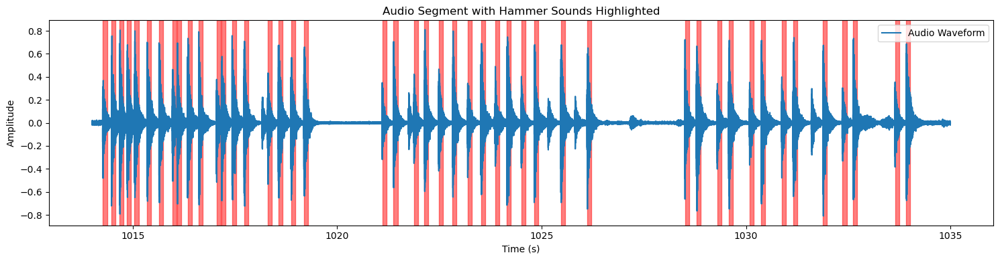

Extracted and highlighted 46 hammer sounds.


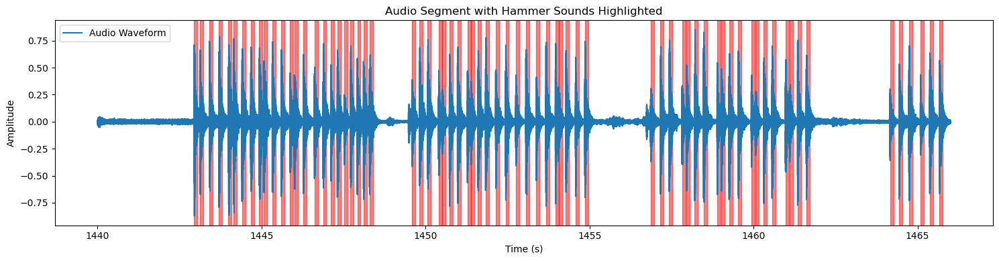

Extracted and highlighted 71 hammer sounds.


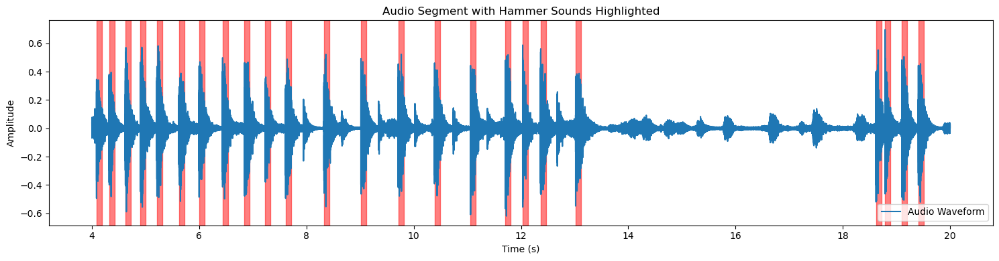

Extracted and highlighted 24 hammer sounds.


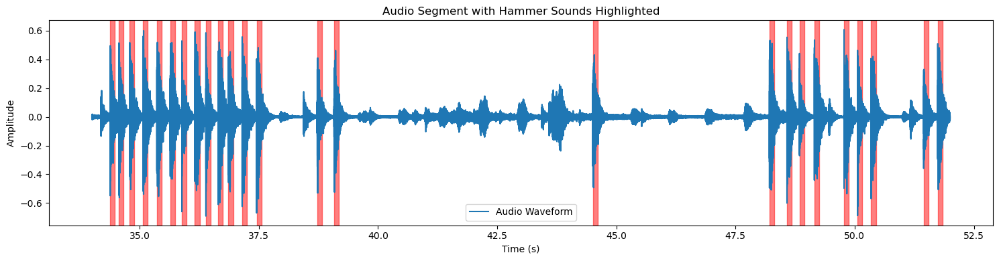

Extracted and highlighted 25 hammer sounds.


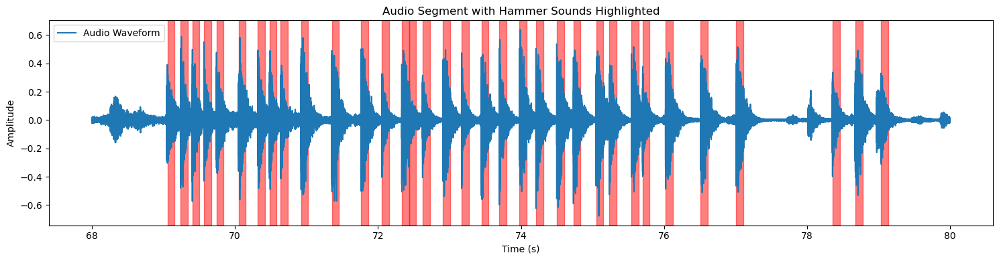

Extracted and highlighted 34 hammer sounds.


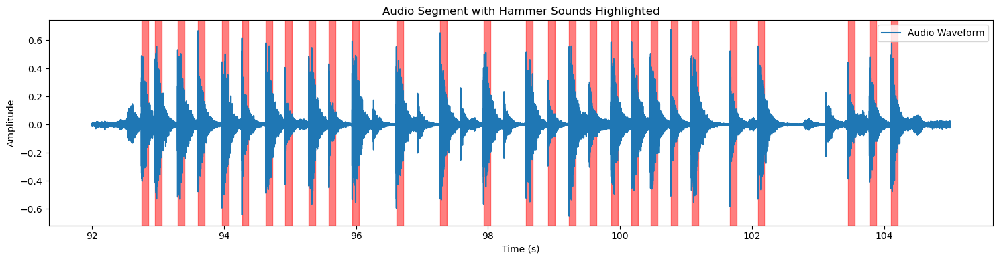

Extracted and highlighted 28 hammer sounds.


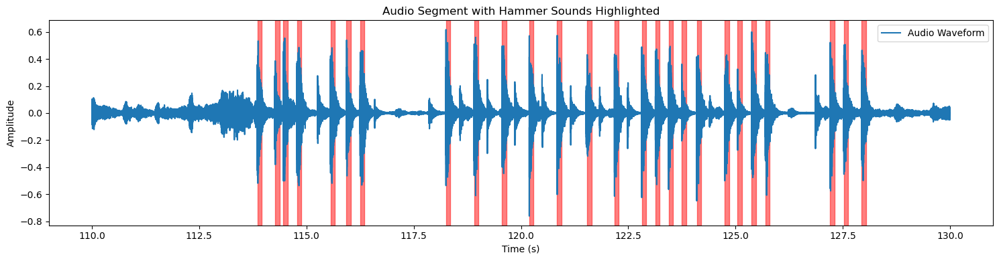

Extracted and highlighted 26 hammer sounds.


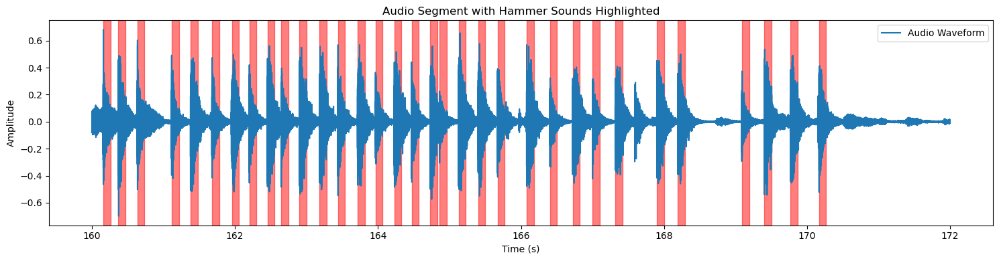

Extracted and highlighted 33 hammer sounds.


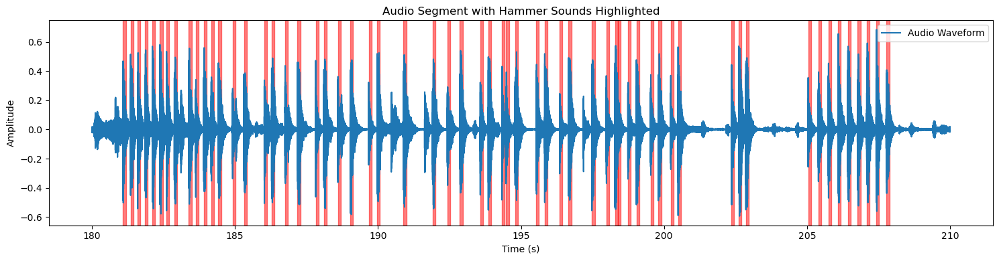

Extracted and highlighted 60 hammer sounds.


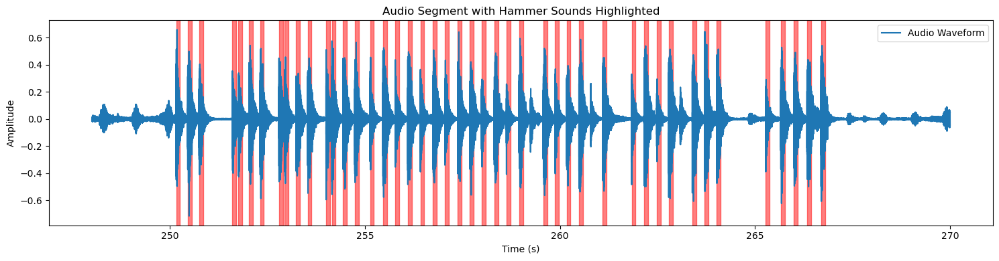

Extracted and highlighted 45 hammer sounds.


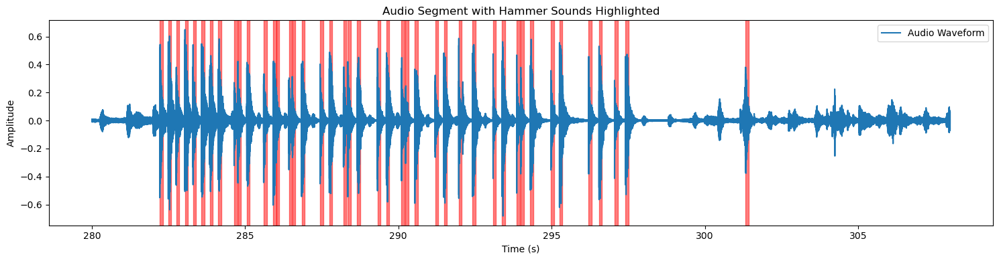

Extracted and highlighted 43 hammer sounds.


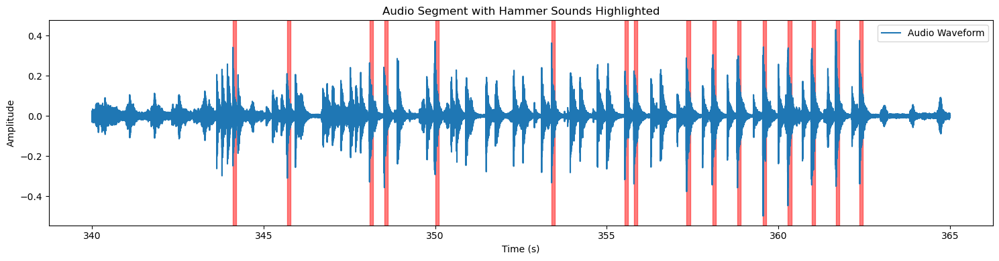

Extracted and highlighted 16 hammer sounds.


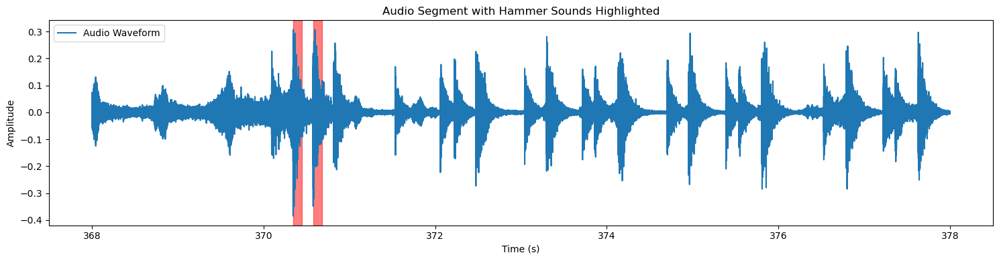

Extracted and highlighted 2 hammer sounds.


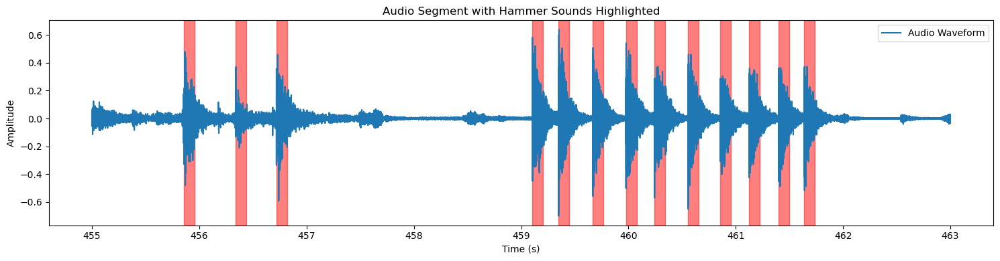

Extracted and highlighted 13 hammer sounds.


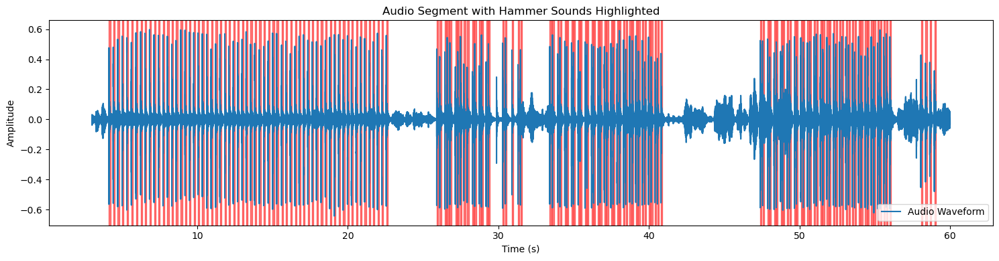

Extracted and highlighted 165 hammer sounds.


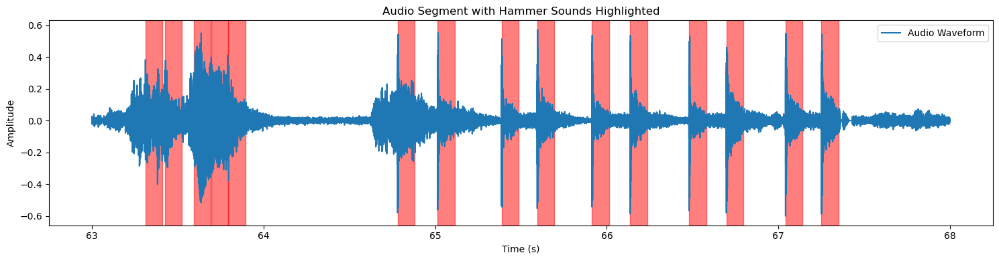

Extracted and highlighted 15 hammer sounds.


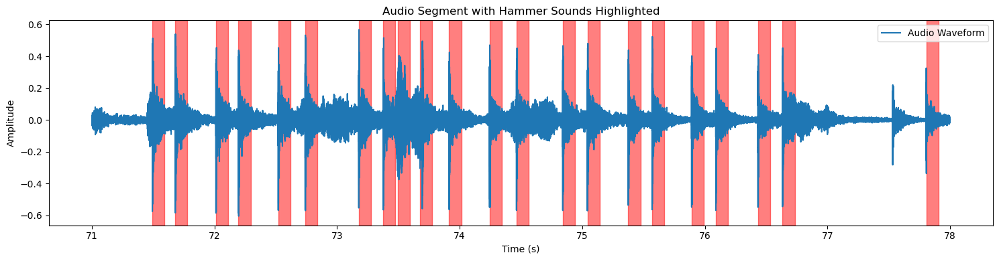

Extracted and highlighted 22 hammer sounds.


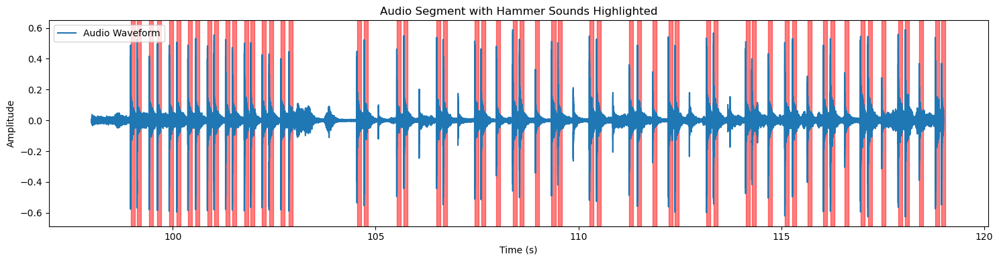

Extracted and highlighted 58 hammer sounds.


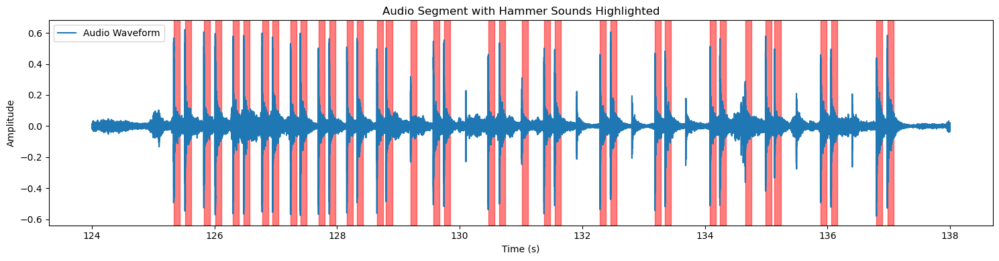

Extracted and highlighted 37 hammer sounds.


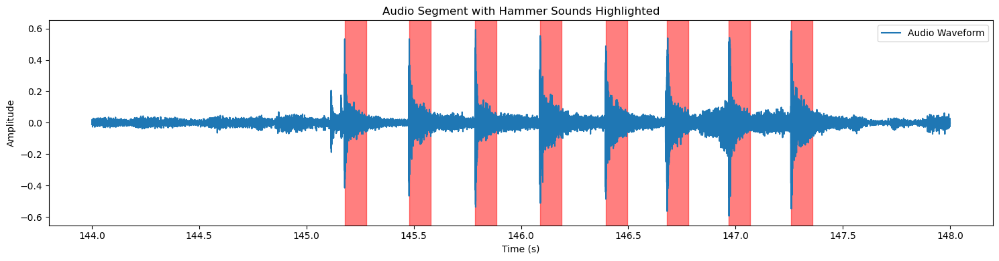

Extracted and highlighted 8 hammer sounds.


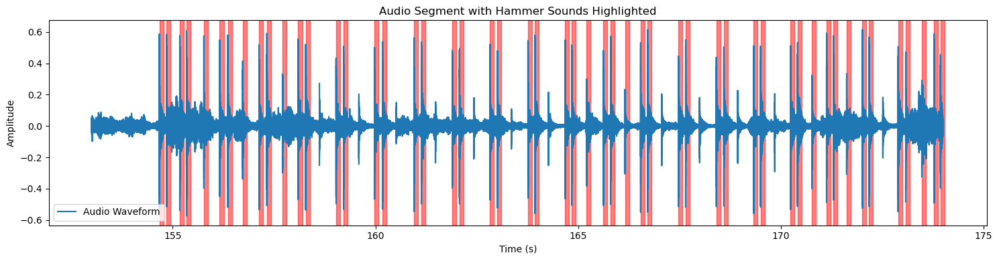

Extracted and highlighted 52 hammer sounds.


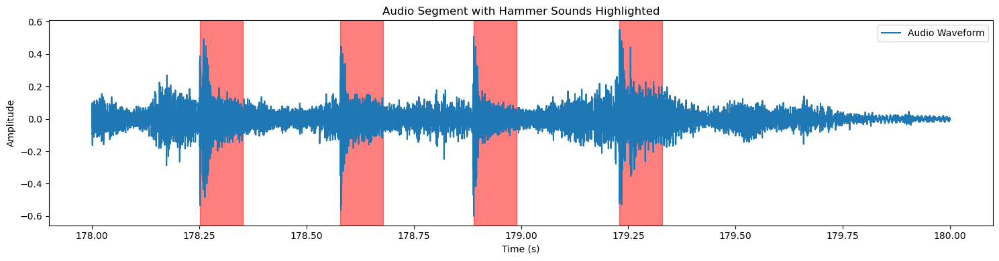

Extracted and highlighted 4 hammer sounds.


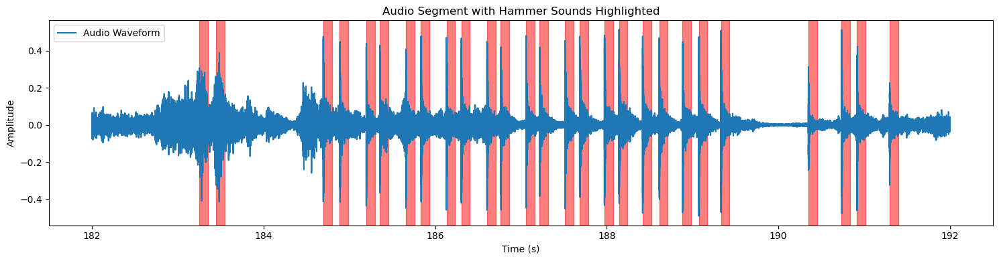

Extracted and highlighted 27 hammer sounds.


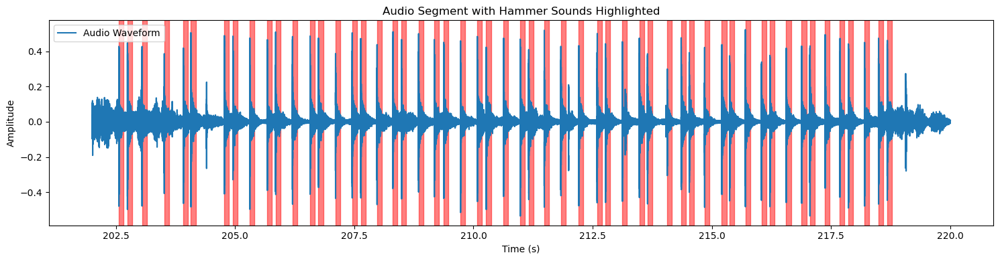

Extracted and highlighted 55 hammer sounds.


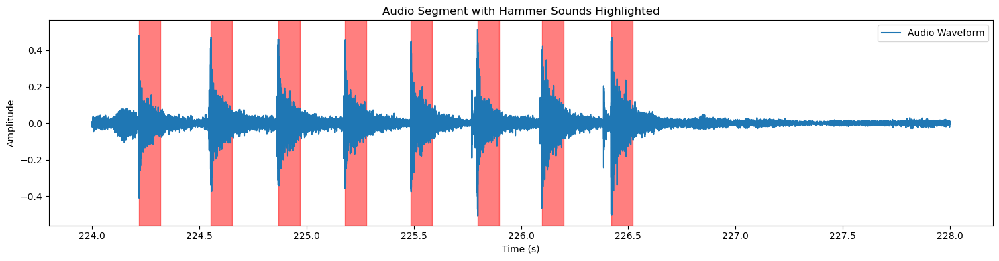

Extracted and highlighted 8 hammer sounds.


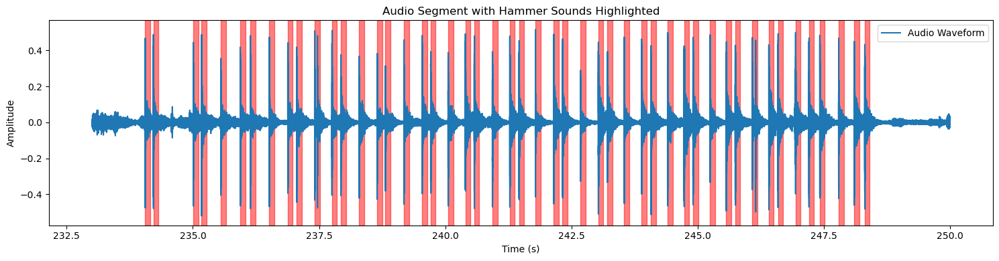

Extracted and highlighted 49 hammer sounds.


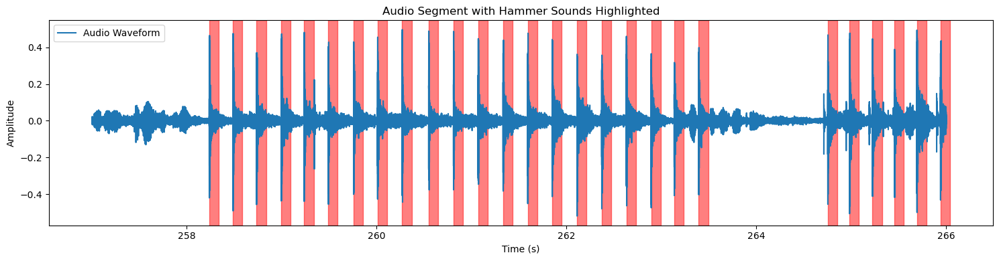

Extracted and highlighted 27 hammer sounds.


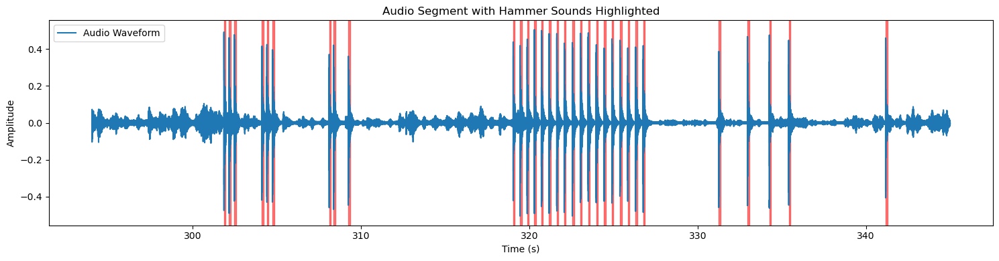

Extracted and highlighted 32 hammer sounds.


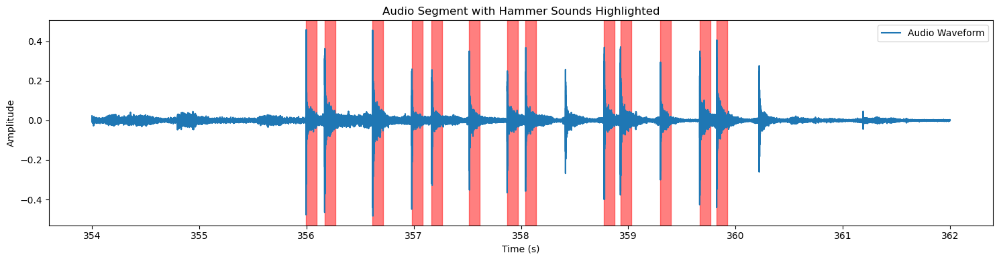

Extracted and highlighted 13 hammer sounds.


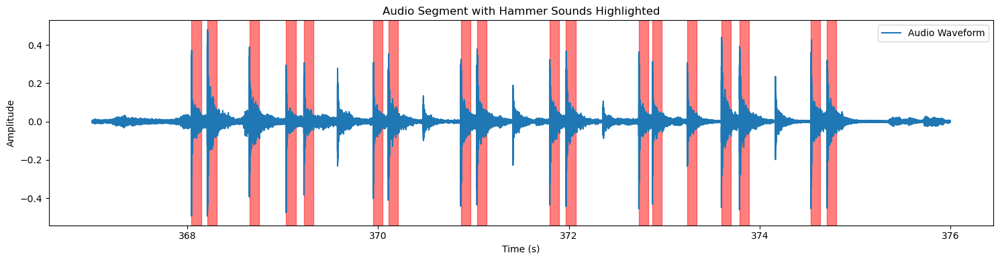

Extracted and highlighted 18 hammer sounds.


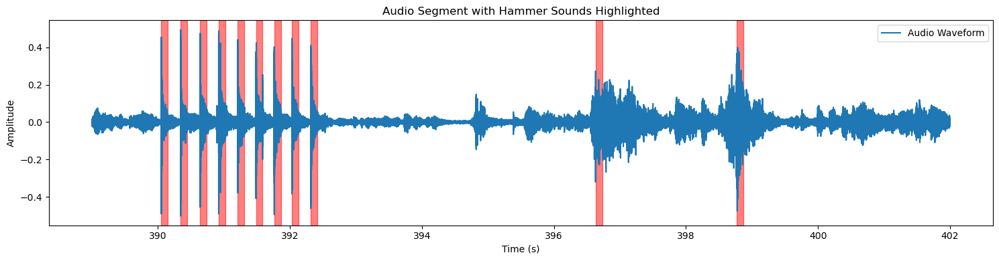

Extracted and highlighted 11 hammer sounds.


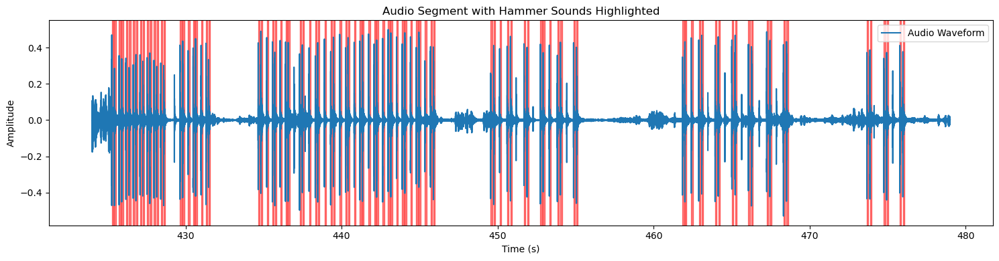

Extracted and highlighted 96 hammer sounds.


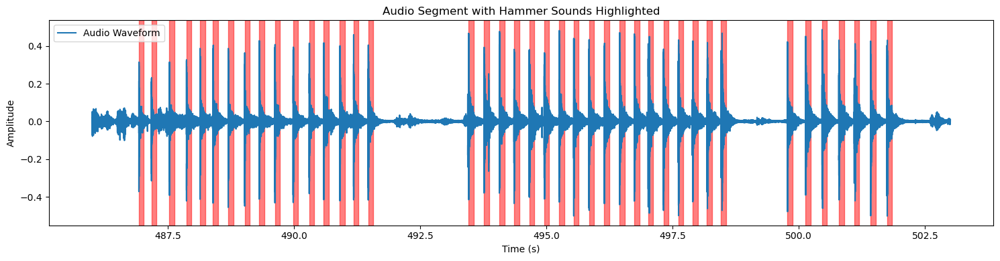

Extracted and highlighted 41 hammer sounds.


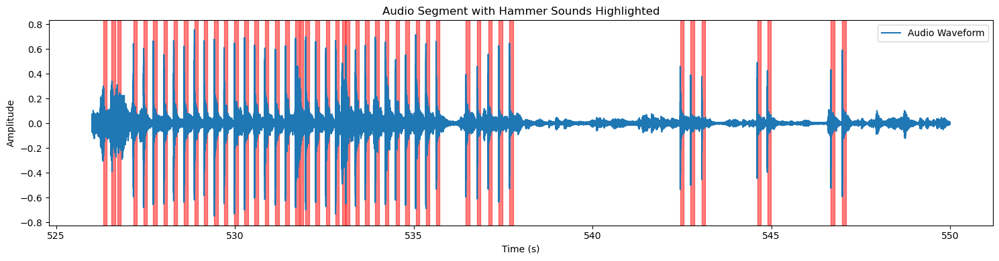

Extracted and highlighted 48 hammer sounds.


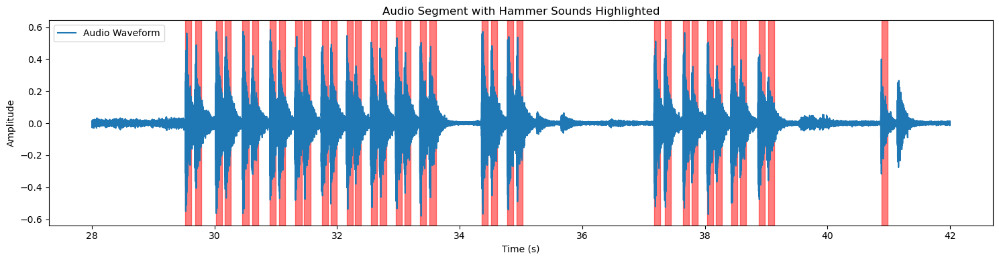

Extracted and highlighted 35 hammer sounds.


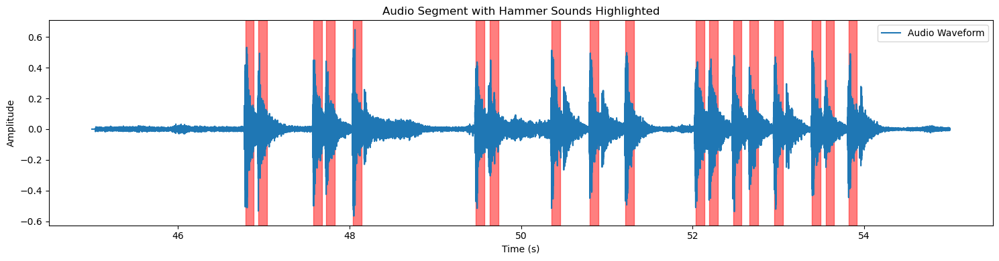

Extracted and highlighted 18 hammer sounds.


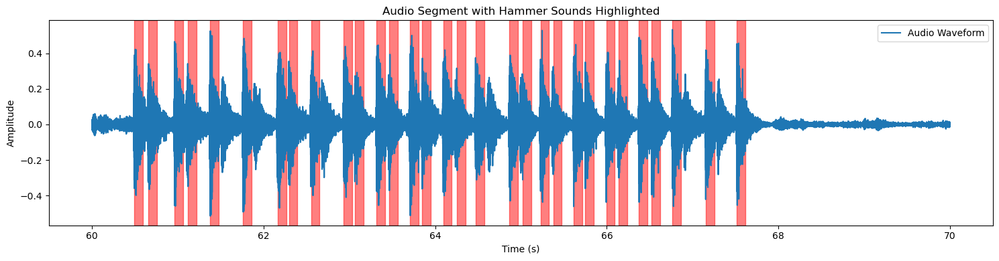

Extracted and highlighted 31 hammer sounds.


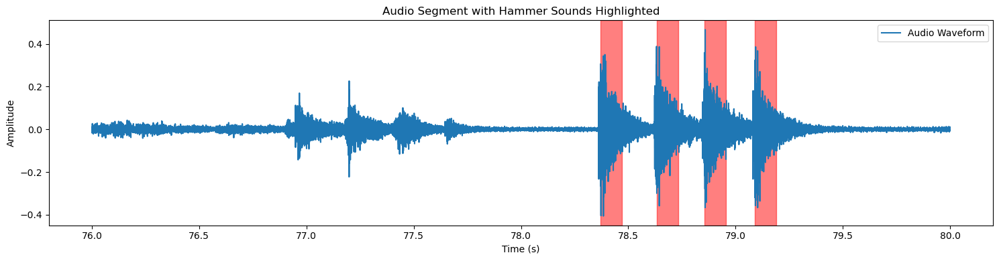

Extracted and highlighted 4 hammer sounds.


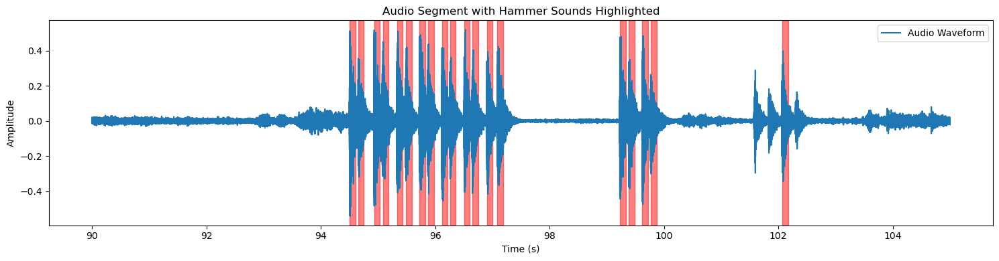

Extracted and highlighted 19 hammer sounds.


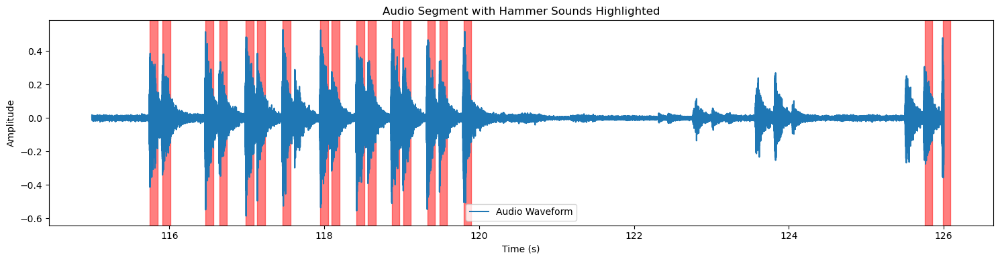

Extracted and highlighted 18 hammer sounds.


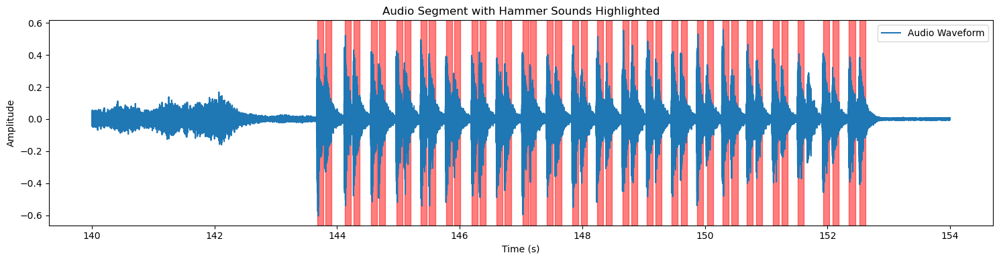

Extracted and highlighted 43 hammer sounds.


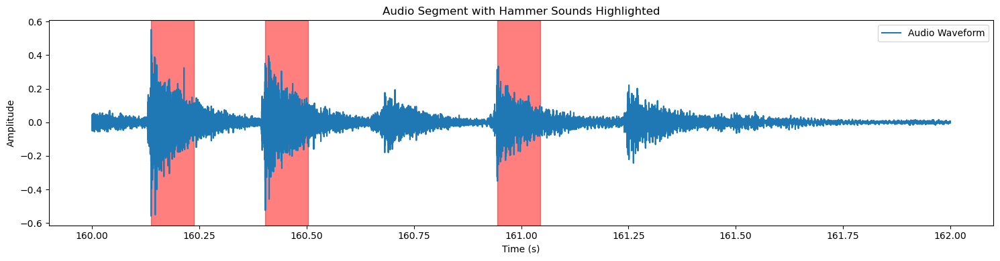

Extracted and highlighted 3 hammer sounds.


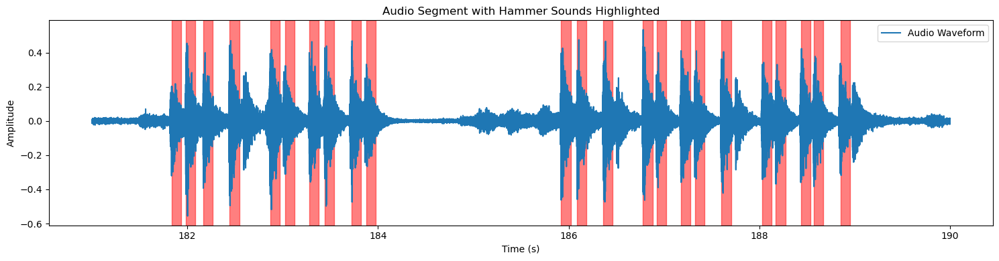

Extracted and highlighted 23 hammer sounds.


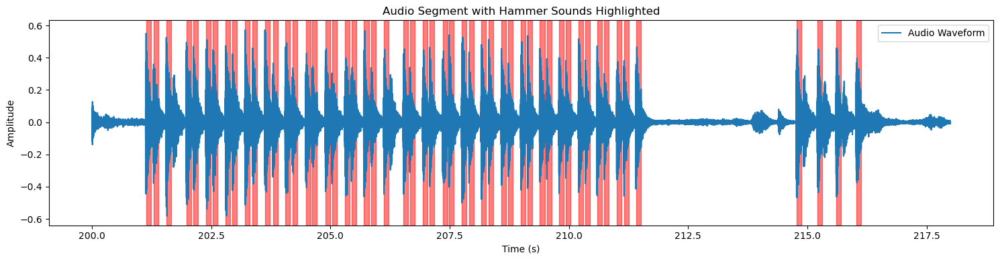

Extracted and highlighted 53 hammer sounds.


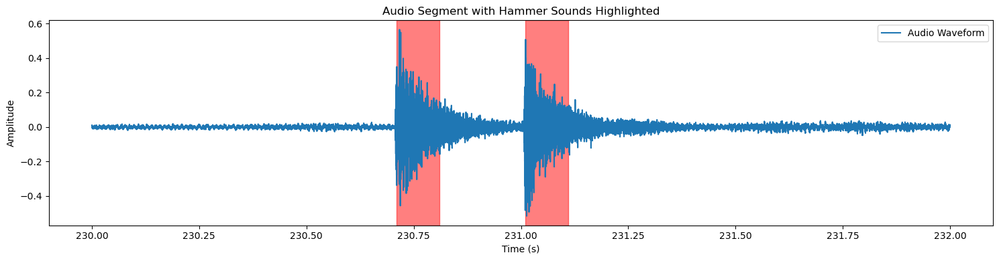

Extracted and highlighted 2 hammer sounds.


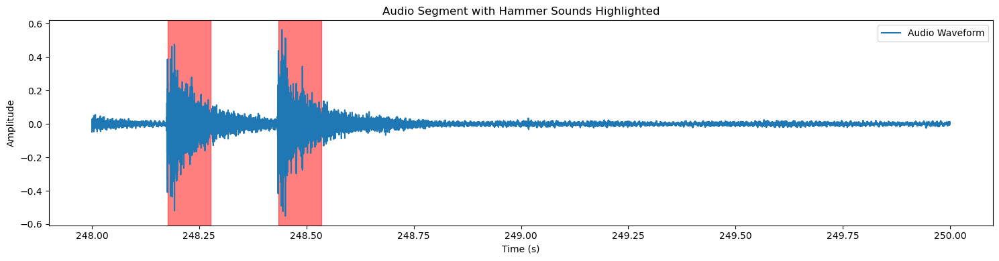

Extracted and highlighted 2 hammer sounds.


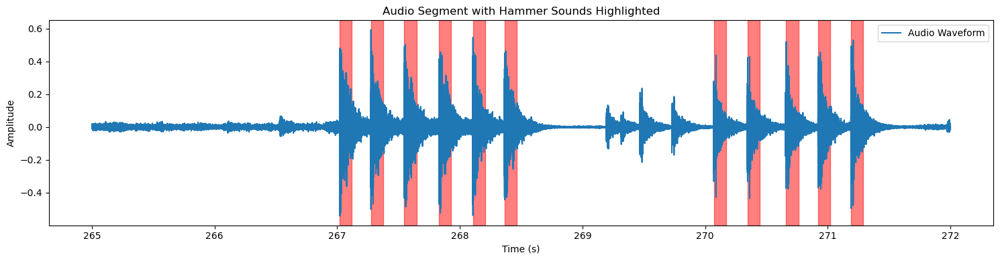

Extracted and highlighted 11 hammer sounds.


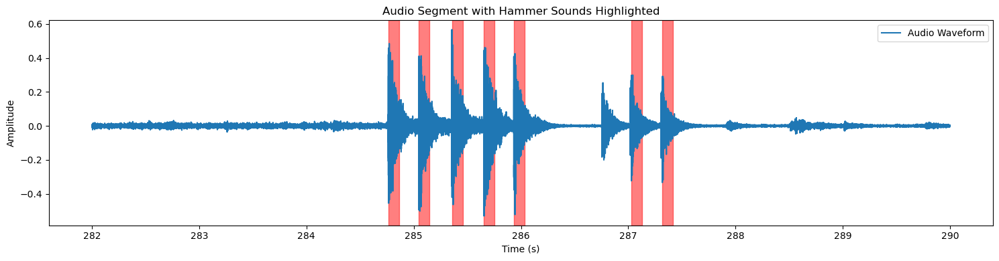

Extracted and highlighted 7 hammer sounds.


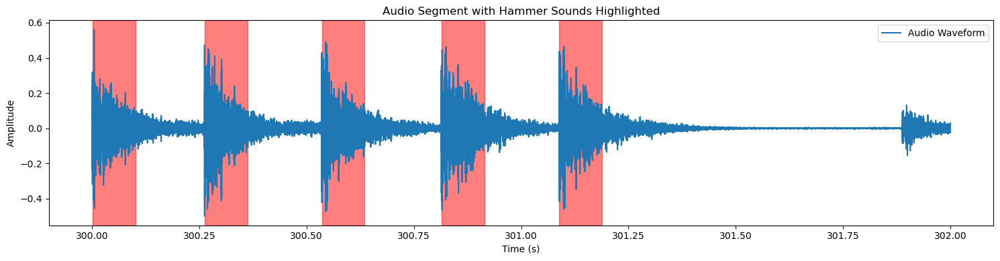

Extracted and highlighted 5 hammer sounds.


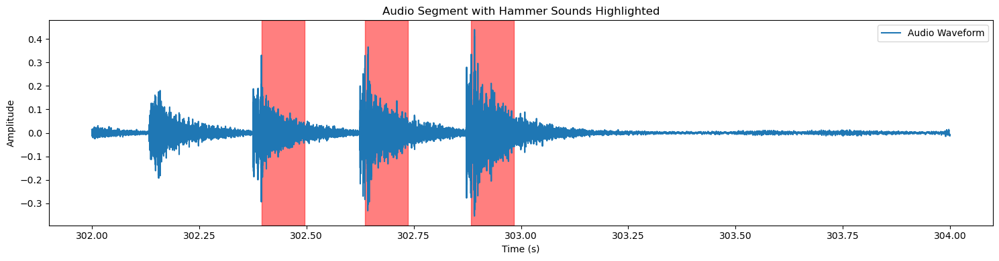

Extracted and highlighted 3 hammer sounds.


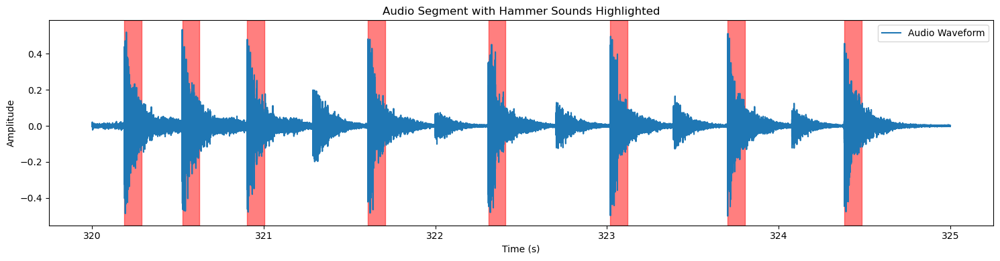

Extracted and highlighted 8 hammer sounds.


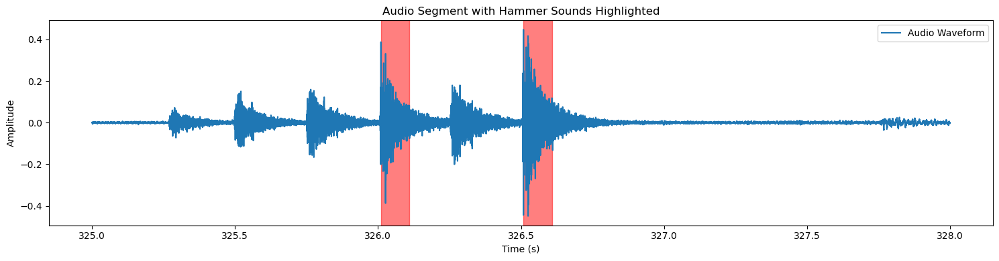

Extracted and highlighted 2 hammer sounds.


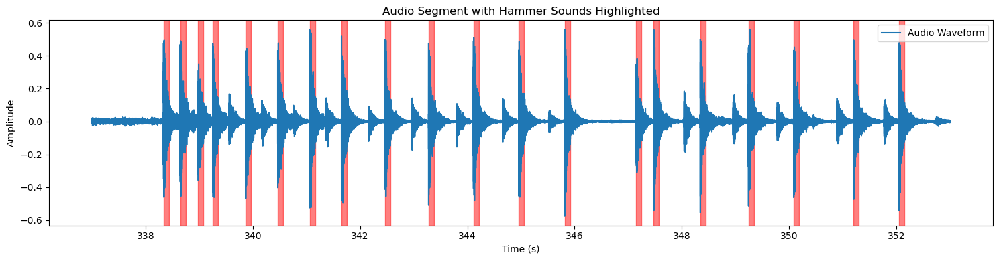

Extracted and highlighted 20 hammer sounds.


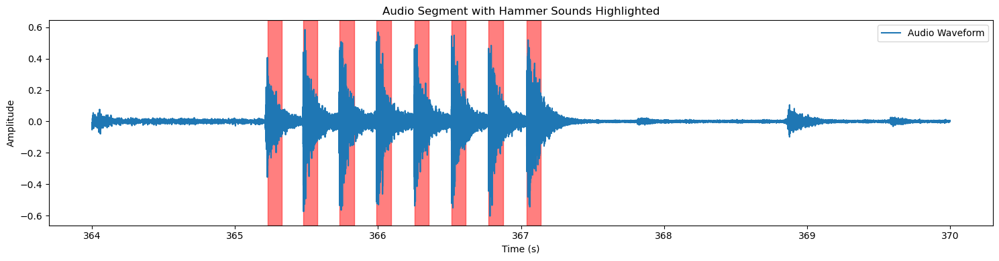

Extracted and highlighted 8 hammer sounds.


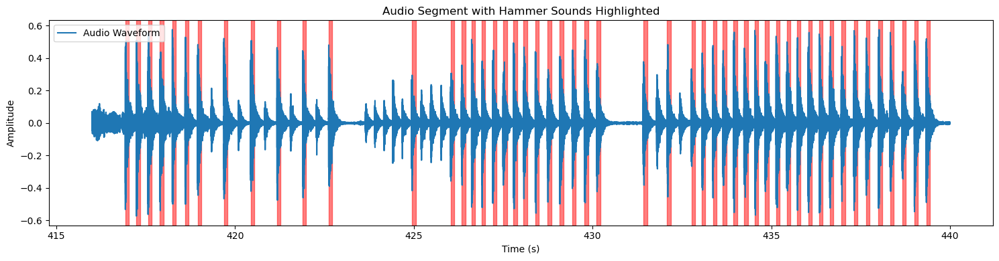

Extracted and highlighted 51 hammer sounds.


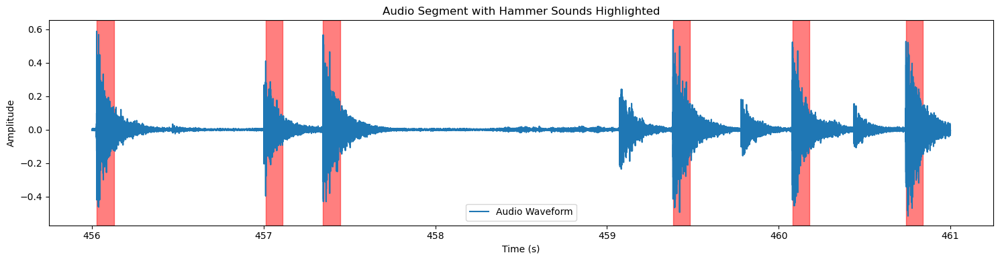

Extracted and highlighted 6 hammer sounds.


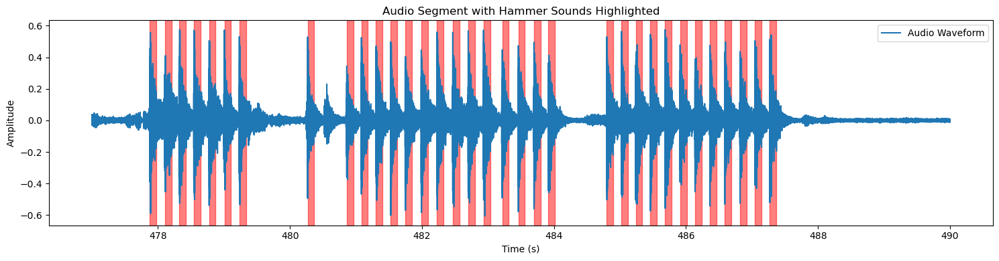

Extracted and highlighted 34 hammer sounds.


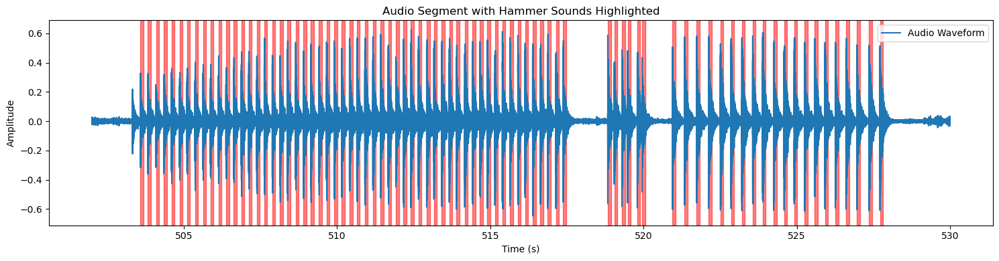

Extracted and highlighted 82 hammer sounds.


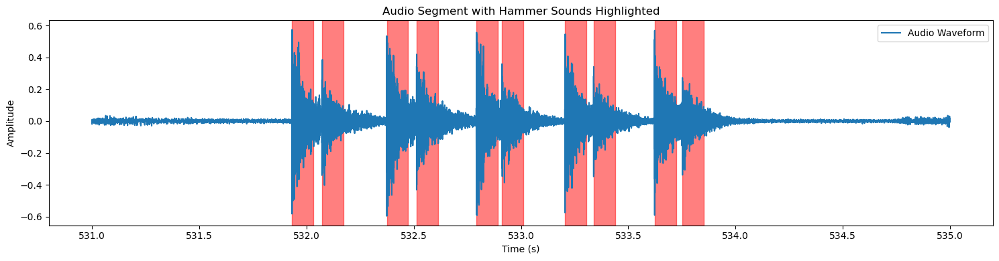

Extracted and highlighted 10 hammer sounds.


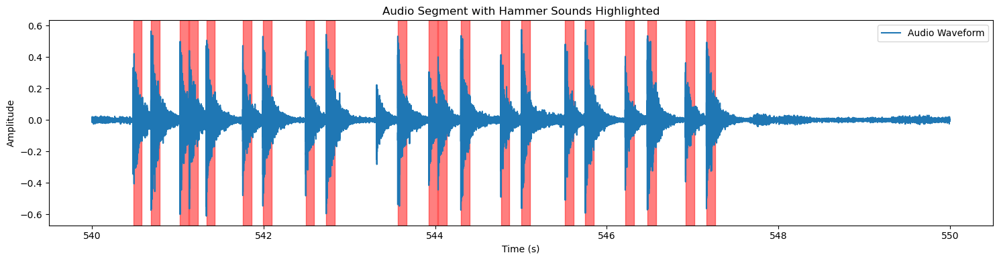

Extracted and highlighted 21 hammer sounds.


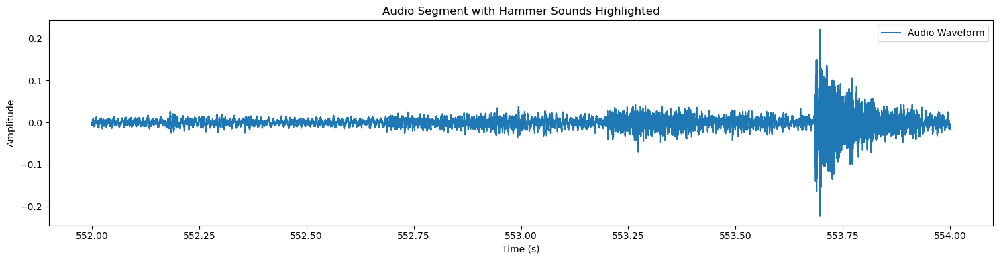

Extracted and highlighted 0 hammer sounds.


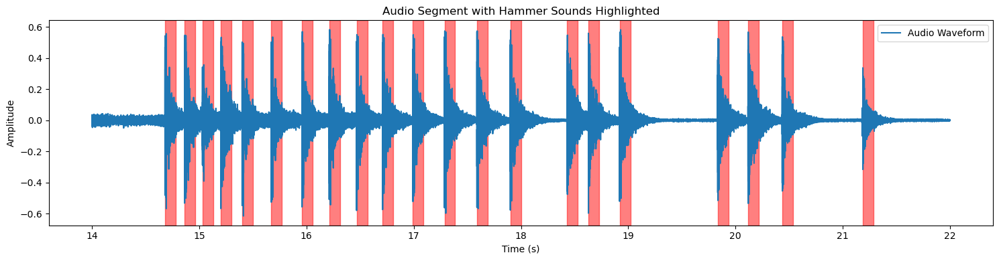

Extracted and highlighted 21 hammer sounds.


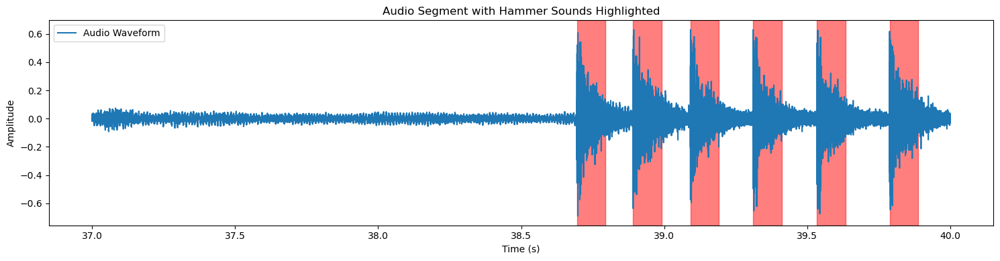

Extracted and highlighted 6 hammer sounds.


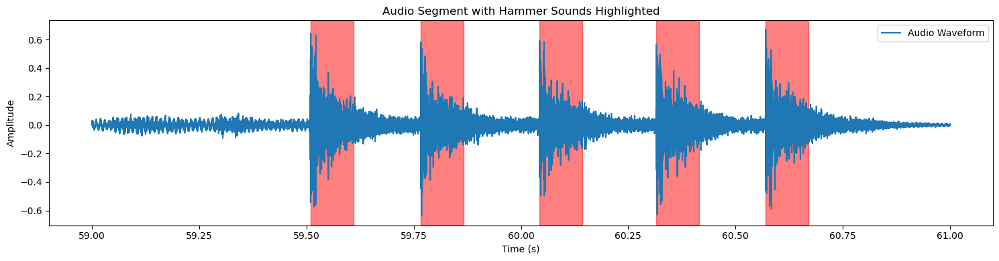

Extracted and highlighted 5 hammer sounds.


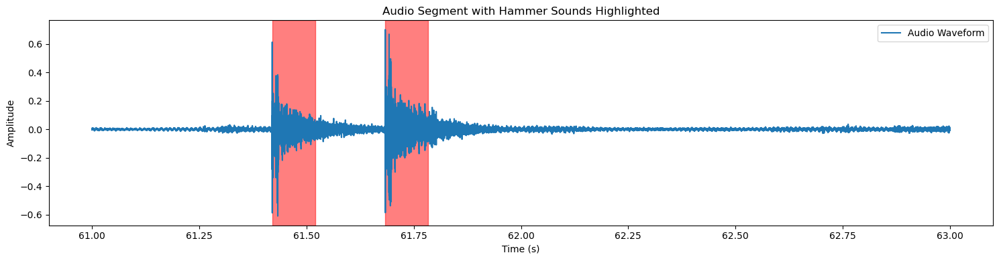

Extracted and highlighted 2 hammer sounds.


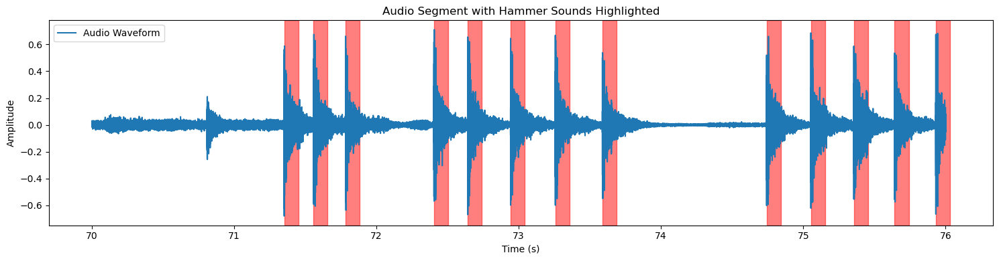

Extracted and highlighted 13 hammer sounds.


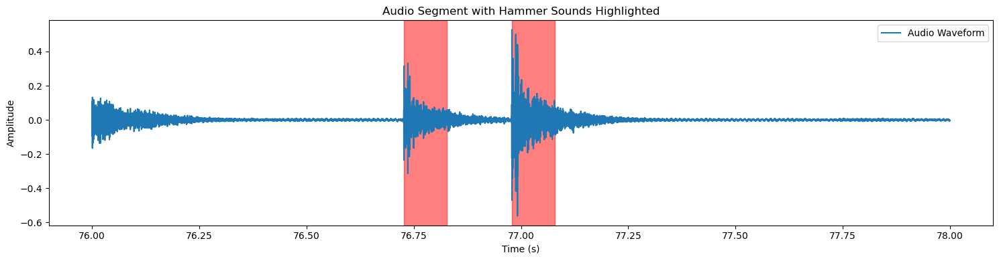

Extracted and highlighted 2 hammer sounds.


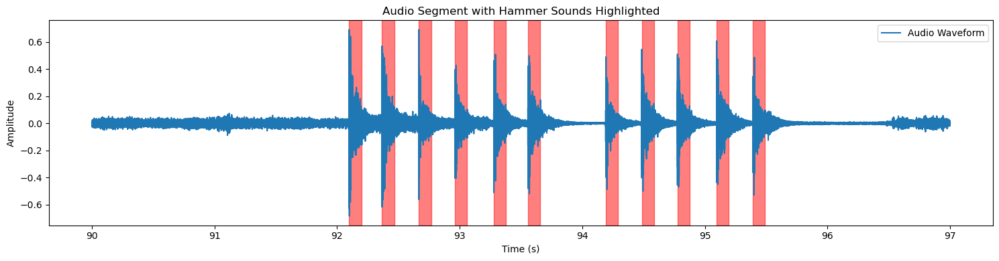

Extracted and highlighted 11 hammer sounds.


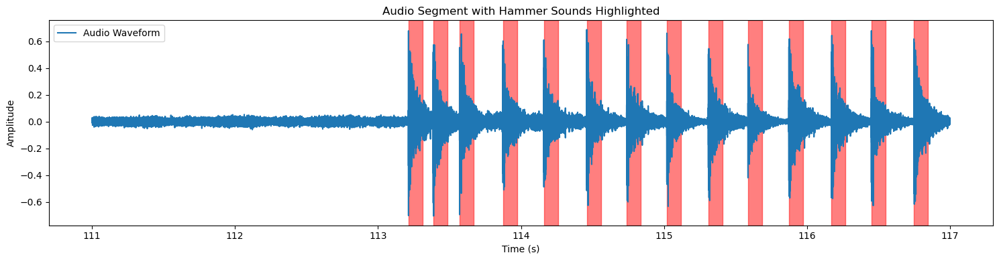

Extracted and highlighted 14 hammer sounds.


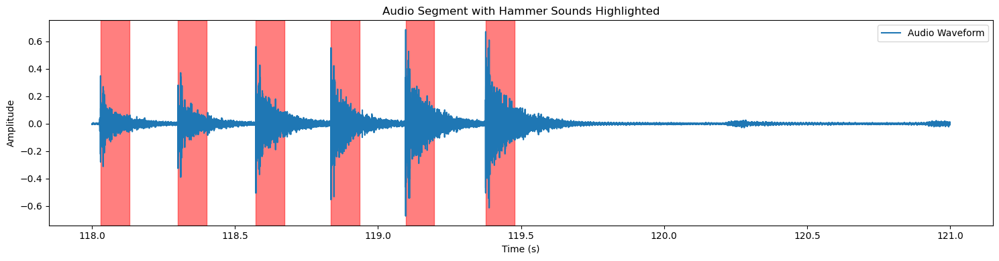

Extracted and highlighted 6 hammer sounds.


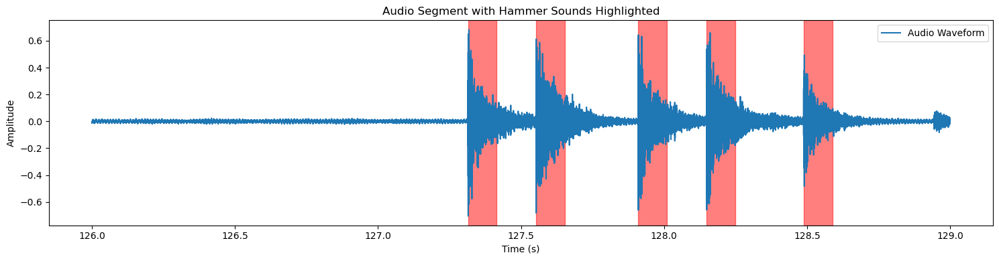

Extracted and highlighted 5 hammer sounds.


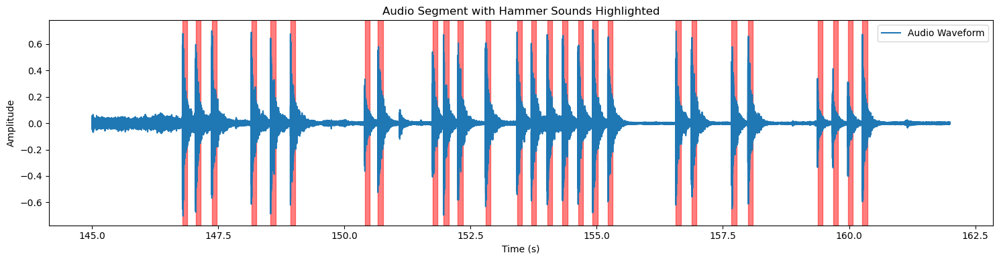

Extracted and highlighted 27 hammer sounds.


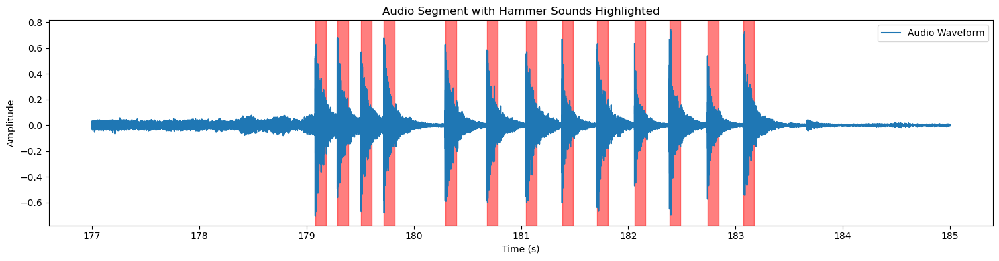

Extracted and highlighted 13 hammer sounds.


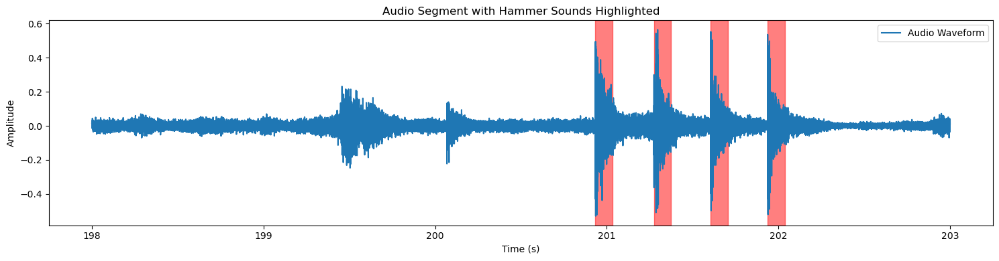

Extracted and highlighted 4 hammer sounds.


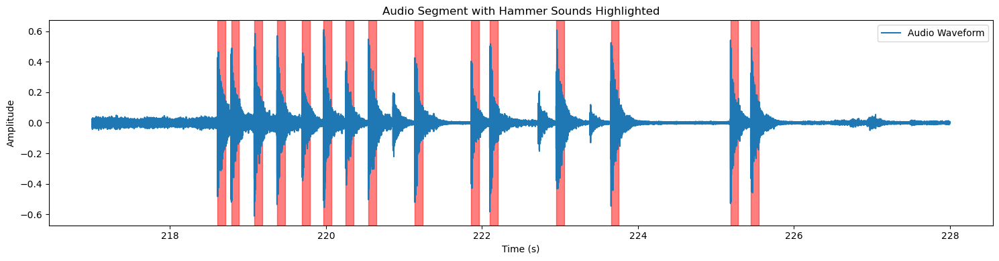

Extracted and highlighted 15 hammer sounds.


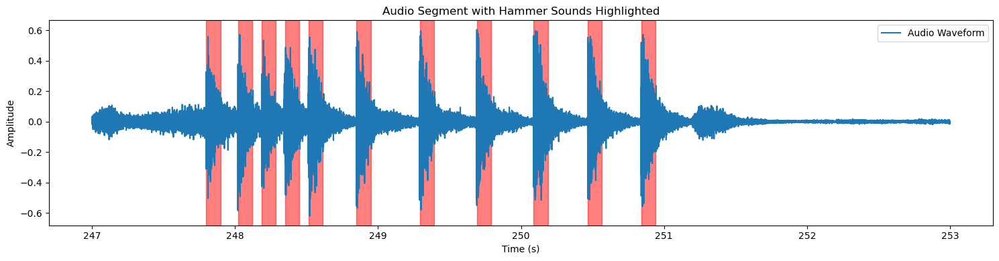

Extracted and highlighted 11 hammer sounds.


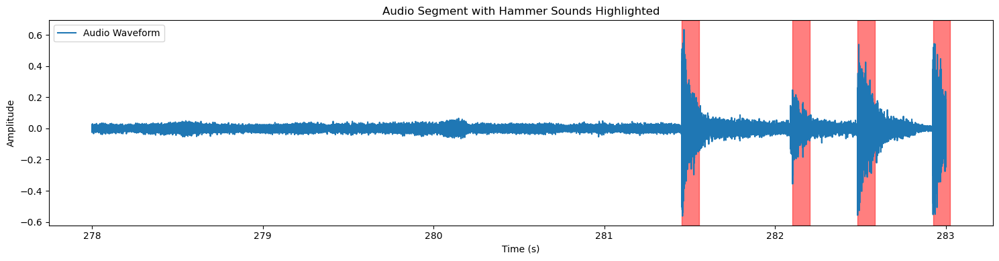

Extracted and highlighted 4 hammer sounds.


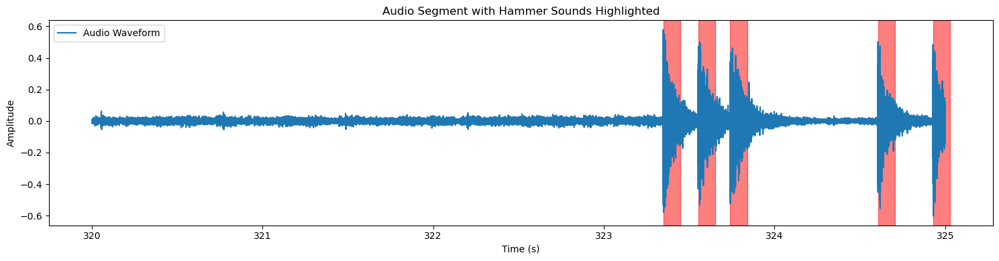

Extracted and highlighted 5 hammer sounds.


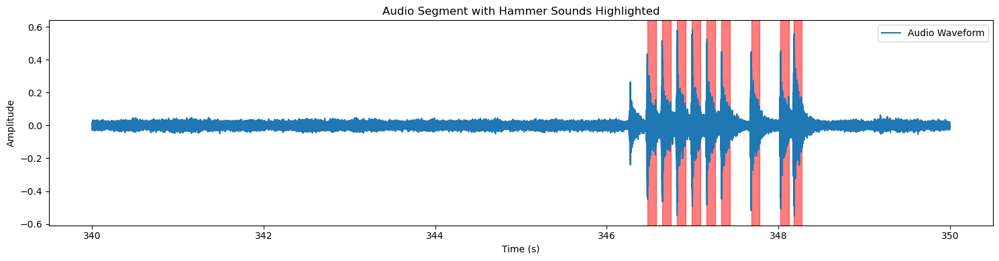

Extracted and highlighted 9 hammer sounds.


In [3]:
file_path = 'ALL_Features.xlsx'
df = pd.read_excel(file_path)

# Convert each row to a dictionary
data = []
for index, row in df.iterrows():
    row_dict = row.to_dict()
    # Parameters
    name = row_dict['name']
    start_time = int(row_dict['start_time']) # Start time of the segment to analyze
    end_time = int(row_dict['end_time'])  # End time of the segment to analyze
    stem = row_dict['stem'] 
    
    audio_file = f'voice/{name}.wav'
    # Make sure the output directory exists
    output_dir = f'voice/{name}'  # Replace with your desired output directory
    min_interval = 0.1  # Minimum interval in seconds between hammer sounds
    post_duration = 0.1  # Duration in seconds to include after the hammer sound
    threshold = 0.3  # Threshold for amplitude to detect hammer sound
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    if not os.path.exists(f'fig'):
        os.makedirs(f'fig')
    extract_and_highlight_hammer_sounds(audio_file, name, stem, output_dir, threshold, start_time, end_time, min_interval, post_duration)

In [3]:
# Function to extract power spectrum within a frequency range
def Extract_FFT(file_path):
    try:
        
        # Load audio file using Librosa
        audio, sr = librosa.load(file_path, sr= 4096, mono=True)
        
        # Check the length of the audio signal
        signal_length = len(audio)

        # Adjust n_fft if it's larger than the signal length
        n_fft = min(2048, signal_length // 2)  

        # Choose an appropriate hop_length 
        hop_length = n_fft // 4

        stft_result = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length)

        # Get the magnitude spectrum (absolute values)
        magnitude_spectrum = np.abs(stft_result) 
        return magnitude_spectrum.flatten()
    
    except Exception as e:
        print(f"Error processing {file_path}: {e}")
        return None

# Classification Models 
- Random Forest
- XGBOOST
- Logistic Regression
- SVM\
Input Features:  Fast Fourier Transform (FFT)

In [4]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import xgboost as xgb

In [5]:
def train_and_evaluate_classifier(classifier, X_train, X_test, y_train, y_test):
    
    classifier.fit(X_train, y_train)
    predictions = classifier.predict(X_test)
    
    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(y_test, predictions, zero_division=0)
    recall = recall_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)
    
    return np.round([accuracy,precision,recall,f1],3)

def Prediction_model(X_train, X_test, y_train, y_test):
    # Define classifiers
    random_forest = RandomForestClassifier(n_estimators=200, random_state=30)
    logistic_regression = LogisticRegression(random_state=0, penalty='l2', solver='lbfgs', max_iter=1000)
    support_vector_machine = SVC(kernel='rbf')
    XGboost = xgb.XGBClassifier()

    classifiers = {
        "Random Forest": random_forest,
        "Logistic Regression": logistic_regression,
        "Support Vector Machine": support_vector_machine,
        "XGBoost": XGboost
    }

    results = pd.DataFrame(columns=["Accuracy", "Precision", "Recall", "F1-Score"])

    # Evaluate each classifier and store results
    for clf_name, clf in classifiers.items():
        metrics = train_and_evaluate_classifier(clf, X_train, X_test, y_train, y_test)
        results.loc[clf_name,:] = metrics
    return results


# B Dataset

In [8]:
file_path = 'ALL_Features.xlsx'
df = pd.read_excel(file_path)
matching_files = []
for group_name, group_data in df.groupby('name'):
    stem = group_data['stem'].max()
    directory_path = f'./voice/{group_name}/'
    pattern = f"*_S{stem}*"
    matching_files +=  glob.glob(os.path.join(directory_path, pattern))

In [9]:
# Directory path
directory_path = "./voice/"
all_files = []
# Iterate through immediate subdirectories and list files within them
for root, dirs, files in os.walk(directory_path):
    for dir_name in dirs:
        subdir_path = os.path.join(root, dir_name)
        for file_name in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path, file_name)
            all_files.append(file_path)


In [10]:
positive_dir = "./B_positive/"
negative_dir = "./B_negative/"

os.makedirs(positive_dir, exist_ok=True)
os.makedirs(negative_dir, exist_ok=True)

pos_counter = 0
neg_counter = 0

for file_path in all_files:
    
    if file_path in matching_files:
        file_name = os.path.basename(file_path)
        shutil.copy(file_path, os.path.join(positive_dir, file_name))
    else:
        file_name = os.path.basename(file_path)
        shutil.copy(file_path, os.path.join(negative_dir, file_name))

len(os.listdir(positive_dir)),len(os.listdir(negative_dir))


(616, 2246)

In [11]:
positive_dir = "./B_positive/"

# List all files in the negative directory
files_list = os.listdir(positive_dir)

# List to store Fourier Transform
fft = []

# List all files in the negative directory
files_list = os.listdir(positive_dir)

# Iterate through files and extract Fourier Transform
for file_name in files_list:
    file_path = os.path.join(positive_dir, file_name)
    fft_audio = Extract_FFT(file_path)
    if fft_audio is not None:
        fft.append(fft_audio)


Pos_fft_array = np.array(fft)

# Check the shape of the resulting array
print(f"Shape of Negative Samples (Fast Fourier Transform) array: {Pos_fft_array.shape}")

Shape of Negative Samples (Fast Fourier Transform) array: (616, 927)


In [12]:
negative_dir = "./B_negative/"

# List all files in the negative directory
files_list = os.listdir(negative_dir)

# List to store Fourier Transform
fft = []

# List all files in the negative directory
files_list = os.listdir(negative_dir)

# Iterate through files and extract Fourier Transform
for file_name in files_list:
    file_path = os.path.join(negative_dir, file_name)
    fft_audio = Extract_FFT(file_path)
    if fft_audio is not None:
        fft.append(fft_audio)


Neg_fft_array = np.array(fft)

# Check the shape of the resulting array
print(f"Shape of Negative Samples (Fast Fourier Transform) array: {Neg_fft_array.shape}")

Shape of Negative Samples (Fast Fourier Transform) array: (2246, 927)


# Classification Models (B Dataset)

In [14]:
all_features = list(Pos_fft_array) + list(Neg_fft_array)
total_features = np.array(all_features)
total_labels = np.hstack((np.ones(len(Pos_fft_array)), np.zeros(len(Neg_fft_array))))

In [15]:
X_train, X_test, y_train, y_test = train_test_split(total_features, total_labels, test_size=0.2, random_state=54)
Results_unscaled = Prediction_model(X_train, X_test, y_train, y_test )
print(f"Results of classifier for unscaled features:\n {Results_unscaled} \n")

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
Results_scaled = Prediction_model(X_train_scaled, X_test_scaled, y_train, y_test )
print(f"Results of classifier for scaled features:\n {Results_scaled}")

Results of classifier for unscaled features:
                        Accuracy Precision Recall F1-Score
Random Forest             0.901     0.973   0.57    0.719
Logistic Regression       0.939     0.904  0.812    0.856
Support Vector Machine    0.927     0.989   0.68    0.806
XGBoost                   0.941      0.97  0.758    0.851 

Results of classifier for scaled features:
                        Accuracy Precision Recall F1-Score
Random Forest             0.901     0.973   0.57    0.719
Logistic Regression       0.939     0.872  0.852    0.862
Support Vector Machine    0.932       1.0  0.695     0.82
XGBoost                   0.941      0.97  0.758    0.851


# A Dateset

In [16]:
# Directory path
directory_path = "./voice/"
all_files = []
# Iterate through immediate subdirectories and list files within them
for root, dirs, files in os.walk(directory_path):
    for dir_name in dirs:
        subdir_path = os.path.join(root, dir_name)
        for file_name in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path, file_name)
            all_files.append(file_path)

In [17]:
file_path = 'ALL_Features.xlsx'
df = pd.read_excel(file_path)
matching_files_max = []
matching_files_min = []
for group_name, group_data in df.groupby('name'):
    max_stem = group_data['stem'].max()
    min_stem = group_data['stem'].min()
    directory_path = f'./voice/{group_name}/'
    pattern_max = f"*_S{max_stem}*"
    pattern_min = f"*_S{min_stem}*"
    matching_files_max += glob.glob(os.path.join(directory_path, pattern_max))
    matching_files_min += glob.glob(os.path.join(directory_path, pattern_min))


len(matching_files_max) , len(matching_files_min)

(616, 451)

In [18]:
# Define your directories
positive_dir = "./A_positive/"
negative_dir = "./A_negative/"

os.makedirs(positive_dir, exist_ok=True)
os.makedirs(negative_dir, exist_ok=True)

pos_counter = 0
neg_counter = 0

for file_path in all_files:
    
    if file_path in matching_files_max:
        file_name = os.path.basename(file_path)
        shutil.copy(file_path, os.path.join(positive_dir, file_name))
    elif file_path in matching_files_min:
        file_name = os.path.basename(file_path)
        shutil.copy(file_path, os.path.join(negative_dir, file_name))

len(os.listdir(positive_dir)),len(os.listdir(negative_dir))


(616, 451)

In [19]:
positive_dir = "./A_positive/"

# List all files in the negative directory
files_list = os.listdir(positive_dir)

# List to store Fourier Transform
fft = []

# List all files in the negative directory
files_list = os.listdir(positive_dir)

# Iterate through files and extract Fourier Transform
for file_name in files_list:
    file_path = os.path.join(positive_dir, file_name)
    fft_audio = Extract_FFT(file_path)
    # print(fft_audio)
    if fft_audio is not None:
        fft.append(fft_audio)


# Convert the list of arrays to a single NumPy array
Pos_fft_array = np.array(fft)


# Check the shape of the resulting array
print(f"Shape of Positive Samples (Fast Fourier Transform) array:  {Pos_fft_array.shape}")

Shape of Positive Samples (Fast Fourier Transform) array:  (616, 927)


In [20]:
negative_dir = "./A_negative/"

# List all files in the negative directory
files_list = os.listdir(negative_dir)

# List to store Fourier Transform
fft = []

# List all files in the negative directory
files_list = os.listdir(negative_dir)

# Iterate through files and extract Fourier Transform
for file_name in files_list:
    file_path = os.path.join(negative_dir, file_name)
    fft_audio = Extract_FFT(file_path)
    if fft_audio is not None:
        fft.append(fft_audio)


Neg_fft_array = np.array(fft)

# Check the shape of the resulting array
print(f"Shape of Negative Samples (Fast Fourier Transform) array:  {Neg_fft_array.shape}")

Shape of Negative Samples (Fast Fourier Transform) array:  (451, 927)


# Classification Models (A dataset)

In [21]:
all_features = list(Pos_fft_array) + list(Neg_fft_array)
total_features = np.array(all_features)
total_labels = np.hstack((np.ones(len(Pos_fft_array)), np.zeros(len(Neg_fft_array))))

In [22]:
X_train, X_test, y_train, y_test = train_test_split(total_features, total_labels, test_size=0.2, random_state=54)
Results_unscaled = Prediction_model(X_train, X_test, y_train, y_test)
print(f"Results of classifier for unscaled features:\n {Results_unscaled} \n")

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
Results_scaled = Prediction_model(X_train_scaled, X_test_scaled, y_train, y_test )
print(f"Results of classifier for scaled features:\n {Results_scaled}")

Results of classifier for unscaled features:
                        Accuracy Precision Recall F1-Score
Random Forest             0.925     0.931  0.945    0.938
Logistic Regression       0.953     0.961  0.961    0.961
Support Vector Machine     0.93     0.959  0.922     0.94
XGBoost                   0.958     0.954  0.977    0.965 

Results of classifier for scaled features:
                        Accuracy Precision Recall F1-Score
Random Forest             0.925     0.931  0.945    0.938
Logistic Regression       0.958     0.961  0.969    0.965
Support Vector Machine    0.944     0.968  0.938    0.952
XGBoost                   0.958     0.954  0.977    0.965


# Last Hammering sounds (Dataset C)

In [23]:
# Directory path
directory_path = "./voice/"
positive_dir = f"./C_positive/"
negative_dir = f"./C_negative/"
all_files = []
# Iterate through immediate subdirectories and list files within them
for root, dirs, files in os.walk(directory_path):
    for dir_name in dirs:
        subdir_path = os.path.join(root, dir_name)
        for file_name in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path, file_name)
            all_files.append(file_path)

In [48]:
Count_last_hits = 4

file_path = 'ALL_Features.xlsx'
df = pd.read_excel(file_path)

Positive_match = []
Negative_match = []

for group_name, group_data in df.groupby('name'):
    stem = group_data['stem'].max()
    directory_path = f'./voice/{group_name}'
    pattern = f"*_S{stem}*"
    matching_files = glob.glob(os.path.join(directory_path, pattern))
    ID_hamering = []
    for file in matching_files:
        match = re.search(r'_([0-9]+)_S', file)
        extracted_i = int(match.group(1))
        ID_hamering.append(extracted_i)
    
    ID_hamering = sorted(ID_hamering)
    
    Positive_match = Positive_match + [f'./voice/{group_name}/{group_name}_hammer_sound_{i}_S{stem}.wav' for i in ID_hamering[-Count_last_hits:] ] 
    Negative_match = Negative_match + [f'./voice/{group_name}/{group_name}_hammer_sound_{i}_S{stem}.wav' for i in ID_hamering[:-Count_last_hits]] 

In [49]:
# Define your directories
positive_dir = f"./C_positive/{Count_last_hits}"
negative_dir = f"./C_negative/{Count_last_hits}"

# Create positive and negative directories if they don't exist
os.makedirs(positive_dir, exist_ok=True)
os.makedirs(negative_dir, exist_ok=True)

# Copy files to respective directories based on condition
for file_path in all_files:
    if file_path in Positive_match:
        shutil.copy(file_path, positive_dir)
    elif file_path in Negative_match:
        shutil.copy(file_path, negative_dir)

len(os.listdir(positive_dir)),len(os.listdir(negative_dir))

(40, 576)

In [50]:
positive_dir = f"./C_positive/{Count_last_hits}"

# List all files in the negative directory
files_list = os.listdir(positive_dir)

# List to store Fourier Transform
fft = []

# List all files in the negative directory
files_list = os.listdir(positive_dir)

# Iterate through files and extract Fourier Transform
for file_name in files_list:
    file_path = os.path.join(positive_dir, file_name)
    fft_audio = Extract_FFT(file_path)
    if fft_audio is not None:
        fft.append(fft_audio)


# Convert the list of arrays to a single NumPy array
Pos_fft_array = np.array(fft)

# Check the shape of the resulting array
print(f"Shape of Positive Samples (Fast Fourier Transform) array:  {Pos_fft_array.shape}")

Shape of Positive Samples (Fast Fourier Transform) array:  (40, 927)


In [51]:
negative_dir = f"./C_negative/{Count_last_hits}/"

# List all files in the negative directory
files_list = os.listdir(negative_dir)

# List to store Fourier Transform
fft = []

# List all files in the negative directory
files_list = os.listdir(negative_dir)

# Iterate through files and extract Fourier Transform
for file_name in files_list:
    file_path = os.path.join(negative_dir, file_name)
    fft_audio = Extract_FFT(file_path)
    if fft_audio is not None:
        fft.append(fft_audio)


Neg_fft_array = np.array(fft)

# Check the shape of the resulting array
print(f"Shape of Negative Samples (Fast Fourier Transform) array:  {Neg_fft_array.shape}")

Shape of Negative Samples (Fast Fourier Transform) array:  (576, 927)


# Classification Models (C dataset)

In [52]:
all_features = list(Pos_fft_array) + list(Neg_fft_array)
total_features = np.array(all_features)
total_labels = np.hstack((np.ones(len(Pos_fft_array)), np.zeros(len(Neg_fft_array))))

In [56]:
print(f"** The model's forecast for the sound of the {Count_last_hits} most recent hammer strikes **\n")
X_train, X_test, y_train, y_test = train_test_split(total_features, total_labels, test_size=0.2, random_state=54)
Results_unscaled = Prediction_model(X_train, X_test, y_train, y_test)
print(f"Results of classifier for unscaled features:\n {Results_unscaled} \n")

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
Results_scaled = Prediction_model(X_train_scaled, X_test_scaled, y_train, y_test )
print(f"Results of classifier for scaled features:\n {Results_scaled}")

** The model's forecast for the sound of the 4 most recent hammer strikes **

Results of classifier for unscaled features:
                        Accuracy Precision Recall F1-Score
Random Forest             0.944       0.0    0.0      0.0
Logistic Regression       0.968       1.0  0.429      0.6
Support Vector Machine    0.944       0.0    0.0      0.0
XGBoost                   0.952       1.0  0.143     0.25 

Results of classifier for scaled features:
                        Accuracy Precision Recall F1-Score
Random Forest             0.944       0.0    0.0      0.0
Logistic Regression       0.944       0.5  0.429    0.462
Support Vector Machine    0.944       0.0    0.0      0.0
XGBoost                   0.952       1.0  0.143     0.25


# Last Hammering sounds of all stem sizes (Dataset D)

In [6]:
# Directory path
directory_path = "./voice/"
positive_dir = f"./D_positive/"
negative_dir = f"./D_negative/"
all_files = []
# Iterate through immediate subdirectories and list files within them
for root, dirs, files in os.walk(directory_path):
    for dir_name in dirs:
        subdir_path = os.path.join(root, dir_name)
        for file_name in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path, file_name)
            all_files.append(file_path)

In [51]:
Count_last_hits = 4

file_path = 'ALL_Features.xlsx'
df = pd.read_excel(file_path)

Positive_match = []
Negative_match = []

for group_name, group_data in df.groupby('name'):
    stem_list = set(group_data['stem'])
    directory_path = f'./voice/{group_name}'
    for stem in stem_list:
        pattern = f"*_S{stem}*"
        matching_files = glob.glob(os.path.join(directory_path, pattern))
        # print(f'stem size = {stem}    counts of hits {len(matching_files)}')
        if len(matching_files) >= 20 :
            ID_hamering = []
            for file in matching_files:
                match = re.search(r'_([0-9]+)_S', file)
                extracted_i = int(match.group(1))
                ID_hamering.append(extracted_i)
    
        ID_hamering = sorted(ID_hamering)
        
        Positive_match = Positive_match + [f'./voice/{group_name}/{group_name}_hammer_sound_{i}_S{stem}.wav' for i in ID_hamering[-Count_last_hits:] ] 
        Negative_match = Negative_match + [f'./voice/{group_name}/{group_name}_hammer_sound_{i}_S{stem}.wav' for i in ID_hamering[:-Count_last_hits]] 

In [52]:
# Define your directories
positive_dir = f"./D_positive/{Count_last_hits}"
negative_dir = f"./D_negative/{Count_last_hits}"

# Create positive and negative directories if they don't exist
os.makedirs(positive_dir, exist_ok=True)
os.makedirs(negative_dir, exist_ok=True)

# Copy files to respective directories based on condition
for file_path in all_files:
    if file_path in Positive_match:
        shutil.copy(file_path, positive_dir)
    elif file_path in Negative_match:
        shutil.copy(file_path, negative_dir)

len(os.listdir(positive_dir)),len(os.listdir(negative_dir))

(196, 2666)

In [53]:
positive_dir = f"./D_positive/{Count_last_hits}"

# List all files in the negative directory
files_list = os.listdir(positive_dir)

# List to store Fourier Transform
fft = []

# List all files in the negative directory
files_list = os.listdir(positive_dir)

# Iterate through files and extract Fourier Transform
for file_name in files_list:
    file_path = os.path.join(positive_dir, file_name)
    fft_audio = Extract_FFT(file_path)
    if fft_audio is not None:
        fft.append(fft_audio)


# Convert the list of arrays to a single NumPy array
Pos_fft_array = np.array(fft)

# Check the shape of the resulting array
print(f"Shape of Positive Samples (Fast Fourier Transform) array:  {Pos_fft_array.shape}")

Shape of Positive Samples (Fast Fourier Transform) array:  (196, 927)


In [54]:
negative_dir = f"./D_negative/{Count_last_hits}/"

# List all files in the negative directory
files_list = os.listdir(negative_dir)

# List to store Fourier Transform
fft = []

# List all files in the negative directory
files_list = os.listdir(negative_dir)

# Iterate through files and extract Fourier Transform
for file_name in files_list:
    file_path = os.path.join(negative_dir, file_name)
    fft_audio = Extract_FFT(file_path)
    if fft_audio is not None:
        fft.append(fft_audio)


Neg_fft_array = np.array(fft)

# Check the shape of the resulting array
print(f"Shape of Negative Samples (Fast Fourier Transform) array:  {Neg_fft_array.shape}")

Shape of Negative Samples (Fast Fourier Transform) array:  (2666, 927)


# Classification Models (D dataset)

In [55]:
all_features = list(Pos_fft_array) + list(Neg_fft_array)
total_features = np.array(all_features)
total_labels = np.hstack((np.ones(len(Pos_fft_array)), np.zeros(len(Neg_fft_array))))

In [56]:
print(f"** The model predicts the sound of the last {Count_last_hits} hammer strikes for each stem size **\n")
X_train, X_test, y_train, y_test = train_test_split(total_features, total_labels, test_size=0.2, random_state=54)
Results_unscaled = Prediction_model(X_train, X_test, y_train, y_test)
print(f"Results of classifier for unscaled features:\n {Results_unscaled} \n")

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
Results_scaled = Prediction_model(X_train_scaled, X_test_scaled, y_train, y_test )
print(f"Results of classifier for scaled features:\n {Results_scaled}")

** The model predicts the sound of the last 4 hammer strikes for each stem size **

Results of classifier for unscaled features:
                        Accuracy Precision Recall F1-Score
Random Forest             0.911       0.0    0.0      0.0
Logistic Regression       0.906     0.412  0.137    0.206
Support Vector Machine    0.911       0.0    0.0      0.0
XGBoost                   0.911       0.5   0.02    0.038 

Results of classifier for scaled features:
                        Accuracy Precision Recall F1-Score
Random Forest             0.911       0.0    0.0      0.0
Logistic Regression       0.902     0.424  0.275    0.333
Support Vector Machine    0.911       0.0    0.0      0.0
XGBoost                   0.911       0.5   0.02    0.038
